# TRIAL BUILD


# Setup - Library_Import
We import all the required Python libraries

In [5]:
    # 1 Data manipulation
import numpy as np
from bs4 import BeautifulSoup as bs
import pandas as pd
import pandas_datareader
from pandas_datareader import data as wb
    # 7 Options for pandas
pd.options.display.max_columns = 50
pd.options.display.max_rows = 30

    # 11 Visualizations
import matplotlib.pyplot as plt
%matplotlib inline
    # 14 More Visualizations
import chart_studio.plotly as py
import plotly
import plotly.tools as tls
import plotly.graph_objs as go
import plotly.offline as ply
plotly.offline.init_notebook_mode(connected=True)
    # 21 Cufflinks binds Plotly directly to pandas dataframes.
import cufflinks as cf
cf.go_offline(connected=True)
cf.set_config_file(theme='white')
 
    # 26 IMPORT API FUNCTIONS
import quandl
import yfinance as yf
from yahoofinancials import YahooFinancials
import requests
import alpha_vantage
from alpha_vantage.timeseries import TimeSeries
import iexfinance
from iexfinance.stocks import Stock
from iexfinance.stocks import get_historical_data
from iexfinance.stocks import get_historical_intraday
from iexfinance.refdata import get_symbols
from iexfinance.data_apis import get_data_points
from iexfinance.data_apis import get_time_series
from iexfinance.altdata import get_social_sentiment
from iexfinance.altdata import get_ceo_compensation

    # 44 MISC LIB IMPORTS
import locale
from datetime import date, datetime
from nsepy import get_history
import os
import time
import csv
import json
from patsy import dmatrices

    # 54

## Local_Library_Import
We import all the required local libraries libraries

In [ ]:
# Include local library paths
import sys

    # uncomment and fill to import local libraries
    
# sys.path.append('path/to/local/lib') 
# Import local libraries

# Data_Processing
Put here the core of the notebook. Feel free di further split this section into subsections.

In [22]:
Symbols = wb.get_nasdaq_symbols(retry_count=3, timeout=30,pause=None)
Symbols.to_csv(r'C:\Users\gordo\Programming\Data_Bank\One\_Symbols.csv')
Symbols

,Nasdaq Traded,Security Name,Listing Exchange,Market Category,ETF,Round Lot Size,Test Issue,Financial Status,CQS Symbol,NASDAQ Symbol,NextShares
Symbol,,,,,,,,,,,
A,True,"Agilent Technologies, Inc. Common Stock",N,,False,100.0,False,NaN,A,A,False
AA,True,Alcoa Corporation Common Stock,N,,False,100.0,False,NaN,AA,AA,False
AAAU,True,Perth Mint Physical Gold ETF,P,,True,100.0,False,NaN,AAAU,AAAU,False
AACG,True,ATA Creativity Global - American Depositary Sh...,Q,G,False,100.0,False,N,NaN,AACG,False
AADR,True,AdvisorShares Dorsey Wright ADR ETF,P,,True,100.0,False,NaN,AADR,AADR,False
...,...,...,...,...,...,...,...,...,...,...,...
ZXYZ.A,True,Nasdaq Symbology Test Common Stock,Q,Q,False,100.0,True,N,NaN,ZXYZ.A,False
ZXZZT,True,NASDAQ TEST STOCK,Q,G,False,100.0,True,N,NaN,ZXZZT,False
ZYME,True,Zymeworks Inc. Common Shares,N,,False,100.0,False,NaN,ZYME,ZYME,False


In [23]:
nasdaq=pd.read_csv(r'C:\Users\gordo\Programming\Data_Bank\One\_Symbols.csv')[['Security Name','Symbol', 'CQS Symbol', 'NASDAQ Symbol']]
nasdaq

,Security Name,Symbol,CQS Symbol,NASDAQ Symbol
0,"Agilent Technologies, Inc. Common Stock",A,A,A
1,Alcoa Corporation Common Stock,AA,AA,AA
2,Perth Mint Physical Gold ETF,AAAU,AAAU,AAAU
3,ATA Creativity Global - American Depositary Sh...,AACG,NaN,AACG
4,AdvisorShares Dorsey Wright ADR ETF,AADR,AADR,AADR
...,...,...,...,...
8907,Nasdaq Symbology Test Common Stock,ZXYZ.A,NaN,ZXYZ.A
8908,NASDAQ TEST STOCK,ZXZZT,NaN,ZXZZT
8909,Zymeworks Inc. Common Shares,ZYME,ZYME,ZYME
8910,"Zynerba Pharmaceuticals, Inc. - Common Stock",ZYNE,NaN,ZYNE


In [27]:
nas_list=pd.read_csv(r'C:\Users\gordo\Programming\Data_Bank\One\_Symbols.csv')['Symbol']
nas_list_1000=[nas_list[:1000]]
nas_list_1000

[0         A
 1        AA
 2      AAAU
 3      AACG
 4      AADR
        ... 
 995    BOOT
 996    BORR
 997    BOSC
 998    BOSS
 999    BOTJ
 Name: Symbol, Length: 1000, dtype: object]

In [ ]:
start = datetime(2019, 1, 1)
end = datetime(2020, 1, 1)

stock_data = pd.DataFrame()

for t in nas_list_1000:
    stock_data[t] = wb.DataReader(t, 'yahoo', start, end)['Adj Close']

#stock_data

In [ ]:
stock_data

# Concept_One

In [75]:
from datapackage import Package

package = Package('https://datahub.io/core/s-and-p-500-companies-financials/datapackage.json')

# print list of all resources:
print(package.resource_names)

# print processed tabular data (if exists any)
for resource in package.resources:
    if resource.descriptor['datahub']['type'] == 'derived/csv':
        resource.read()

['validation_report', 'constituents_csv', 'constituents-financials_csv', 'constituents_json', 'constituents-financials_json', 's-and-p-500-companies-financials_zip', 'constituents', 'constituents-financials']


In [43]:
Col_names =['Symbol', 'Name','Sector','Price','P/E','Div Yield', 'Ear/sh','52 low','52 high','Mkt Cap',
            'EBITDA','Price/Sales','Price/Book','SEC']

STOCKS=pd.DataFrame(resource.read(), columns = Col_names)
STOCKS

,Symbol,Name,Sector,Price,P/E,Div Yield,Ear/sh,52 low,52 high,Mkt Cap,EBITDA,Price/Sales,Price/Book,SEC
0,MMM,3M Company,Industrials,222.89,24.31,2.3328617,7.92,259.77,175.49,138721055226,9048000000,4.3902707,11.34,http://www.sec.gov/cgi-bin/browse-edgar?action...
1,AOS,A.O. Smith Corp,Industrials,60.24,27.76,1.1479592,1.7,68.39,48.925,10783419933,601000000,3.5754826,6.35,http://www.sec.gov/cgi-bin/browse-edgar?action...
2,ABT,Abbott Laboratories,Health Care,56.27,22.51,1.9089824,0.26,64.6,42.28,102121042306,5744000000,3.7404804,3.19,http://www.sec.gov/cgi-bin/browse-edgar?action...
3,ABBV,AbbVie Inc.,Health Care,108.48,19.41,2.4995599,3.29,125.86,60.05,181386347059,10310000000,6.291571,26.14,http://www.sec.gov/cgi-bin/browse-edgar?action...
4,ACN,Accenture plc,Information Technology,150.51,25.47,1.7144699,5.44,162.6,114.82,98765855553,5643228000,2.604117,10.62,http://www.sec.gov/cgi-bin/browse-edgar?action...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
500,XYL,Xylem Inc.,Industrials,70.24,30.94,1.1700794,1.83,76.81,46.86,12915021000,722000000,2.7262094,5.31,http://www.sec.gov/cgi-bin/browse-edgar?action...
501,YUM,Yum! Brands Inc,Consumer Discretionary,76.3,27.25,1.7970798,4.07,86.93,62.85,27003303098,2289000000,6.3136363,212.08,http://www.sec.gov/cgi-bin/browse-edgar?action...
502,ZBH,Zimmer Biomet Holdings,Health Care,115.53,14.32,0.7948336,9.01,133.49,108.17,24454698119,2007400000,3.1648953,2.39,http://www.sec.gov/cgi-bin/browse-edgar?action...
503,ZION,Zions Bancorp,Financials,50.71,17.73,1.480933,2.6,55.61,38.43,10670678640,0,3.7945793,1.42,http://www.sec.gov/cgi-bin/browse-edgar?action...


In [44]:
STOCKS.to_csv(r'C:\Users\gordo\Programming\Data_Bank\One\_Symbol_Today.csv')

STOCKS

,Symbol,Name,Sector,Price,P/E,Div Yield,Ear/sh,52 low,52 high,Mkt Cap,EBITDA,Price/Sales,Price/Book,SEC
0,MMM,3M Company,Industrials,222.89,24.31,2.3328617,7.92,259.77,175.49,138721055226,9048000000,4.3902707,11.34,http://www.sec.gov/cgi-bin/browse-edgar?action...
1,AOS,A.O. Smith Corp,Industrials,60.24,27.76,1.1479592,1.7,68.39,48.925,10783419933,601000000,3.5754826,6.35,http://www.sec.gov/cgi-bin/browse-edgar?action...
2,ABT,Abbott Laboratories,Health Care,56.27,22.51,1.9089824,0.26,64.6,42.28,102121042306,5744000000,3.7404804,3.19,http://www.sec.gov/cgi-bin/browse-edgar?action...
3,ABBV,AbbVie Inc.,Health Care,108.48,19.41,2.4995599,3.29,125.86,60.05,181386347059,10310000000,6.291571,26.14,http://www.sec.gov/cgi-bin/browse-edgar?action...
4,ACN,Accenture plc,Information Technology,150.51,25.47,1.7144699,5.44,162.6,114.82,98765855553,5643228000,2.604117,10.62,http://www.sec.gov/cgi-bin/browse-edgar?action...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
500,XYL,Xylem Inc.,Industrials,70.24,30.94,1.1700794,1.83,76.81,46.86,12915021000,722000000,2.7262094,5.31,http://www.sec.gov/cgi-bin/browse-edgar?action...
501,YUM,Yum! Brands Inc,Consumer Discretionary,76.3,27.25,1.7970798,4.07,86.93,62.85,27003303098,2289000000,6.3136363,212.08,http://www.sec.gov/cgi-bin/browse-edgar?action...
502,ZBH,Zimmer Biomet Holdings,Health Care,115.53,14.32,0.7948336,9.01,133.49,108.17,24454698119,2007400000,3.1648953,2.39,http://www.sec.gov/cgi-bin/browse-edgar?action...
503,ZION,Zions Bancorp,Financials,50.71,17.73,1.480933,2.6,55.61,38.43,10670678640,0,3.7945793,1.42,http://www.sec.gov/cgi-bin/browse-edgar?action...


# Section_Head
* some short description about this section

1. Concept
2. Concept
3. concept

In [ ]:
symbol_list=["A AAL AAP AAPL ABBV ABC ABMD ABT ACN ADBE ADI ADM ADP ADS ADSK AEE AEP AES AFL AGN AIG AIV AIZ AJG AKAM ALB ALGN ALK ALL ALLE ALXN AMAT AMCR AMD AME AMGN AMP AMT AMZN ANET ANSS ANTM AON AOS APA APD APH APTV ARE ARNC ATO ATVI AVB AVGO AVY AWK AXP AZO BA BAC BAX BBY BDX BEN BF.B BIIB BK BKNG BKR BLK BLL BMY BR BRK.B BSX BWA BXP C CAG CAH CAT CB CBOE CBRE CCI CCL CDNS CDW CE CERN CF CFG CHD CHRW CHTR CI CINF CL CLX CMA CMCSA CME CMG CMI CMS CNC CNP COF COG COO COP COST COTY CPB CPRI CPRT CRM CSCO CSX CTAS CTL CTSH CTVA CTXS CVS CVX CXO D DAL DD DE DFS DG DGX DHI DHR DIS DISCA DISCK DISH DLR DLTR DOV DOW DRE DRI DTE DUK DVA DVN DXC EA EBAY ECL ED EFX EIX EL EMN EMR EOG EQIX EQR ES ESS ETFC ETN ETR EVRG EW EXC EXPD EXPE EXR F FANG FAST FB FBHS FCX FDX FE FFIV FIS FISV FITB FLIR FLS FLT FMC FOX FOXA FRC FRT FTI FTNT FTV GD GE GILD GIS GL GLW GM GOOG GOOGL GPC GPN GPS GRMN GS GWW HAL HAS HBAN HBI HCA HD HES HFC HIG HII HLT HOG HOLX HON HP HPE HPQ HRB HRL HSIC HST HSY HUM IBM ICE IDXX IEX IFF ILMN INCY INFO INTC INTU IP IPG IPGP IQV IR IRM ISRG IT ITW IVZ J JBHT JCI JKHY JNJ JNPR JPM JWN K KEY KEYS KHC KIM KLAC KMB KMI KMX KO KR KSS KSU L LB LDOS LEG LEN LH LHX LIN LKQ LLY LMT LNC LNT LOW LRCX LUV LVS LW LYB LYV M MA MAA MAR MAS MCD MCHP MCK MCO MDLZ MDT MET MGM MHK MKC MKTX MLM MMC MMM MNST MO MOS MPC MRK MRO MS MSCI MSFT MSI MTB MTD MU MXIM MYL NBL NCLH NDAQ NEE NEM NFLX NI NKE NLOK NLSN NOC NOV NOW NRG NSC NTAP NTRS NUE NVDA NVR NWL NWS NWSA O ODFL OKE OMC ORCL ORLY OXY PAYC PAYX PBCT PCAR PEAK PEG PEP PFE PFG PG PGR PH PHM PKG PKI PLD PM PNC PNR PNW PPG PPL PRGO PRU PSA PSX PVH PWR PXD PYPL QCOM QRVO RCL RE REG REGN RF RHI RJF RL RMD ROK ROL ROP ROST RSG RTN SBAC SBUX SCHW SEE SHW SIVB SJM SLB SLG SNA SNPS SO SPG SPGI SRE STE STT STX STZ SWK SWKS SYF SYK SYY T TAP TDG TEL TFC TFX TGT TIF TJX TMO TMUS TPR TROW TRV TSCO TSN TTWO TWTR TXN TXT UA UAA UAL UDR UHS ULTA UNH UNM UNP UPS URI USB UTX V VAR VFC VIAC VLO VMC VNO VRSK VRSN VRTX VTR VZ WAB WAT WBA WDC WEC WELL WFC WHR WLTW WM WMB WMT WRB WRK WU WY WYNN XEC XEL XLNX XOM XRAY XRX XYL YUM ZBH ZBRA ZION ZTS "]

print(a)



In [54]:
import yfinance as yf
data = yf.download("A AAL AAP AAPL ABBV ABC ABMD ABT ACN ADBE ADI ADM ADP ADS ADSK AEE AEP AES AFL AGN AIG AIV AIZ AJG AKAM ALB ALGN ALK ALL ALLE ALXN AMAT AMCR AMD AME AMGN AMP AMT AMZN ANET ANSS ANTM AON AOS APA APD APH APTV ARE ARNC ATO ATVI AVB AVGO AVY AWK AXP AZO BA BAC BAX BBY BDX BEN BF.B BIIB BK BKNG BKR BLK BLL BMY BR BRK.B BSX BWA BXP C CAG CAH CAT CB CBOE CBRE CCI CCL CDNS CDW CE CERN CF CFG CHD CHRW CHTR CI CINF CL CLX CMA CMCSA CME CMG CMI CMS CNC CNP COF COG COO COP COST COTY CPB CPRI CPRT CRM CSCO CSX CTAS CTL CTSH CTVA CTXS CVS CVX CXO D DAL DD DE DFS DG DGX DHI DHR DIS DISCA DISCK DISH DLR DLTR DOV DOW DRE DRI DTE DUK DVA DVN DXC EA EBAY ECL ED EFX EIX EL EMN EMR EOG EQIX EQR ES ESS ETFC ETN ETR EVRG EW EXC EXPD EXPE EXR F FANG FAST FB FBHS FCX FDX FE FFIV FIS FISV FITB FLIR FLS FLT FMC FOX FOXA FRC FRT FTI FTNT FTV GD GE GILD GIS GL GLW GM GOOG GOOGL GPC GPN GPS GRMN GS GWW HAL HAS HBAN HBI HCA HD HES HFC HIG HII HLT HOG HOLX HON HP HPE HPQ HRB HRL HSIC HST HSY HUM IBM ICE IDXX IEX IFF ILMN INCY INFO INTC INTU IP IPG IPGP IQV IR IRM ISRG IT ITW IVZ J JBHT JCI JKHY JNJ JNPR JPM JWN K KEY KEYS KHC KIM KLAC KMB KMI KMX KO KR KSS KSU L LB LDOS LEG LEN LH LHX LIN LKQ LLY LMT LNC LNT LOW LRCX LUV LVS LW LYB LYV M MA MAA MAR MAS MCD MCHP MCK MCO MDLZ MDT MET MGM MHK MKC MKTX MLM MMC MMM MNST MO MOS MPC MRK MRO MS MSCI MSFT MSI MTB MTD MU MXIM MYL NBL NCLH NDAQ NEE NEM NFLX NI NKE NLOK NLSN NOC NOV NOW NRG NSC NTAP NTRS NUE NVDA NVR NWL NWS NWSA O ODFL OKE OMC ORCL ORLY OXY PAYC PAYX PBCT PCAR PEAK PEG PEP PFE PFG PG PGR PH PHM PKG PKI PLD PM PNC PNR PNW PPG PPL PRGO PRU PSA PSX PVH PWR PXD PYPL QCOM QRVO RCL RE REG REGN RF RHI RJF RL RMD ROK ROL ROP ROST RSG RTN SBAC SBUX SCHW SEE SHW SIVB SJM SLB SLG SNA SNPS SO SPG SPGI SRE STE STT STX STZ SWK SWKS SYF SYK SYY T TAP TDG TEL TFC TFX TGT TIF TJX TMO TMUS TPR TROW TRV TSCO TSN TTWO TWTR TXN TXT UA UAA UAL UDR UHS ULTA UNH UNM UNP UPS URI USB UTX V VAR VFC VIAC VLO VMC VNO VRSK VRSN VRTX VTR VZ WAB WAT WBA WDC WEC WELL WFC WHR WLTW WM WMB WMT WRB WRK WU WY WYNN XEC XEL XLNX XOM XRAY XRX XYL YUM ZBH ZBRA ZION ZTS ",
                   start="2019-1-1", end="2020-1-1")
#data

[*********************100%***********************]  505 of 505 completed

2 Failed downloads:
- BRK.B: No data found, symbol may be delisted
- BF.B: No data found for this date range, symbol may be delisted


In [55]:
data.to_csv(r'C:\Users\gordo\Programming\Data_Bank\One\_Symbol_Hist.csv')

data

Adj Close                                                \
                    A        AAL         AAP        AAPL       ABBV   
Date                                                                  
2019-01-02  65.134018  31.963160  157.679230  155.214005  83.331375   
2019-01-03  62.734497  29.581665  162.601715  139.753540  80.585724   
2019-01-04  64.905960  31.530161  158.567856  145.719513  83.181953   
2019-01-07  66.284187  32.425678  160.894318  145.395203  84.396011   
2019-01-08  67.255898  31.904110  159.776016  148.166870  84.788246   
...               ...        ...         ...         ...        ...   
2019-12-24  85.120255  29.072563  160.570007  283.596924  88.652267   
2019-12-26  85.269928  29.560759  159.270004  289.223602  88.632538   
2019-12-27  85.239998  28.335287  158.350006  289.113831  88.010933   
2019-12-30  84.900002  28.195801  159.119995  290.829773  87.339996   
2019-12-31  85.309998  28.574404  160.160004  292.954712  87.359734   

                                                                      \
                  ABC        ABMD        ABT         ACN        ADBE   
Date                                                                   
2019-01-02  72.719398  309.959991  68.076973  138.303879  224.570007   
2019-01-03  71.664497  302.290009  64.864136  133.581940  215.699997   
2019-01-04  72.494736  313.440002  66.715439  138.776093  226.190002   
2019-01-07  73.012421  314.799988  67.714539  139.258118  229.259995   
2019-01-08  73.793823  318.420013  66.901543  142.779892  232.679993   
...               ...         ...        ...         ...         ...   
2019-12-24  85.045425  172.300003  86.910866  210.795059  329.640015   
2019-12-26  84.677055  171.009995  86.910866  211.233368  331.200012   
2019-12-27  84.537666  169.270004  87.030357  211.402710  330.790009   
2019-12-30  83.273232  167.289993  86.432899  209.828781  328.339996   
2019-12-31  84.647179  170.589996  86.492645  209.759064  329.809998   

                                                                       \
                   ADI        ADM         ADP         ADS        ADSK   
Date                                                                    
2019-01-02   83.732750  39.252548  127.517586  151.568893  128.960007   
2019-01-03   78.674881  39.080009  123.666794  147.735291  121.849998   
2019-01-04   80.584984  39.981045  128.595444  157.733887  128.279999   
2019-01-07   81.091736  40.182339  127.899734  157.724121  132.720001   
2019-01-08   83.070061  40.930004  128.654221  160.465195  133.869995   
...                ...        ...         ...         ...         ...   
2019-12-24  119.073654  45.720314  169.910004  110.321701  183.910004   
2019-12-26  119.083603  45.839378  170.350006  109.665680  184.240005   
2019-12-27  118.805107  45.938595  170.770004  110.242195  185.380005   
2019-12-30  118.218300  45.759998  169.589996  110.023514  183.300003   
2019-12-31  118.198402  45.988205  170.500000  111.524422  183.460007   

                                                                               \
                  AEE        AEP        AES        AFL         AGN        AIG   
Date                                                                            
2019-01-02  61.911411  70.182968  13.631915  44.346638  132.793976  38.630932   
2019-01-03  62.067333  70.019386  13.622300  43.226284  132.979675  37.782650   
2019-01-04  62.944401  70.664062  14.074135  43.762100  139.332047  39.176952   
2019-01-07  62.223259  70.269562  14.141429  43.995918  139.205017  39.401211   
2019-01-08  63.207531  71.135544  14.468287  44.132305  142.293243  39.557220   
...               ...        ...        ...        ...         ...        ...   
2019-12-24  75.750000  93.197571  19.620941  52.480263  190.719101  50.939999   
2019-12-26  75.639999  93.237297  19.789745  52.341007  190.878525  50.619999   
2019-12-27  76.300003  93.545181  19.839392  52.341007  190.699173  51.070000   
2019-12-30  7

In [56]:
data_return = data.apply(lambda x: x / x[0])
data_return - 1

Adj Close                                                    \
                   A       AAL       AAP      AAPL      ABBV       ABC   
Date                                                                     
2019-01-02  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
2019-01-03 -0.036840 -0.074507  0.031218 -0.099607 -0.032949 -0.014506   
2019-01-04 -0.003501 -0.013547  0.005636 -0.061170 -0.001793 -0.003089   
2019-01-07  0.017659  0.014470  0.020390 -0.063260  0.012776  0.004029   
2019-01-08  0.032577 -0.001847  0.013298 -0.045403  0.017483  0.014775   
...              ...       ...       ...       ...       ...       ...   
2019-12-24  0.306848 -0.090435  0.018333  0.827135  0.063852  0.169501   
2019-12-26  0.309146 -0.075162  0.010089  0.863386  0.063615  0.164436   
2019-12-27  0.308686 -0.113502  0.004254  0.862679  0.056156  0.162519   
2019-12-30  0.303466 -0.117866  0.009137  0.873734  0.048105  0.145131   
2019-12-31  0.309761 -0.106021  0.015733  0.887424  0.048341  0.164025   

                                                                        \
                ABMD       ABT       ACN      ADBE       ADI       ADM   
Date                                                                     
2019-01-02  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
2019-01-03 -0.024745 -0.047194 -0.034142 -0.039498 -0.060405 -0.004396   
2019-01-04  0.011227 -0.020000  0.003414  0.007214 -0.037593  0.018559   
2019-01-07  0.015615 -0.005324  0.006900  0.020884 -0.031541  0.023687   
2019-01-08  0.027294 -0.017266  0.032364  0.036113 -0.007914  0.042735   
...              ...       ...       ...       ...       ...       ...   
2019-12-24 -0.444122  0.276656  0.524144  0.467872  0.422068  0.164773   
2019-12-26 -0.448284  0.276656  0.527313  0.474819  0.422187  0.167806   
2019-12-27 -0.453897  0.278411  0.528538  0.472993  0.418861  0.170334   
2019-12-30 -0.460285  0.269635  0.517158  0.462083  0.411853  0.165784   
2019-12-31 -0.449639  0.270513  0.516654  0.468629  0.411615  0.171598   

                                                                        \
                 ADP       ADS      ADSK       AEE       AEP       AES   
Date                                                                     
2019-01-02  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
2019-01-03 -0.030198 -0.025293 -0.055133  0.002518 -0.002331 -0.000705   
2019-01-04  0.008453  0.040675 -0.005273  0.016685  0.006855  0.032440   
2019-01-07  0.002997  0.040610  0.029156  0.005037  0.001234  0.037377   
2019-01-08  0.008914  0.058695  0.038074  0.020935  0.013573  0.061354   
...              ...       ...       ...       ...       ...       ...   
2019-12-24  0.332444 -0.272135  0.426101  0.223522  0.327923  0.439339   
2019-12-26  0.335894 -0.276463  0.428660  0.221746  0.328489  0.451722   
2019-12-27  0.339188 -0.272659  0.437500  0.232406  0.332876  0.455364   
2019-12-30  0.329934 -0.274102  0.421371  0.236606  0.330612  0.459734   
2019-12-31  0.337070 -0.264200  0.422612  0.240482  0.337404  0.449536   

                                                                        \
                 AFL       AGN       AIG       AIV       AIZ       AJG   
Date                                                                     
2019-01-02  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
2019-01-03 -0.025264  0.001398 -0.021959  0.008737 -0.015982 -0.018779   
2019-01-04 -0.013181  0.049235  0.014134  0.012279  0.003885  0.005981   
2019-01-07 -0.007909  0.048278  0.019939  0.012987  0.007880  0.003060   
2019-01-08 -0.004833  0.071534  0.023978  0.040850  0.009101  0.007512   
...              ...       ...       ...       ...       ...       ...   
2019-12-24  0.183410  0.436203  0.318632  0.236645  0.463593  0.341525   
2019-12-26  0.180270  0.437403  0.310349  0.238351  0.464047  0.341384   
2019-12-27  0.180270  0.436053  0.321998  0.248583  0.470739  0.344221   
2019-12-30  

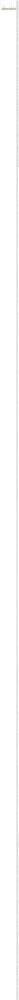

In [57]:
data_return.plot(grid = True, figsize=(15,9)).axhline(y = 1, color = "black", lw = 2)

In [64]:
symbol_list=["A AAL AAP AAPL ABBV ABC ABMD ABT ACN ADBE ADI ADM ADP ADS ADSK AEE AEP AES AFL AGN AIG AIV AIZ AJG AKAM ALB ALGN ALK ALL ALLE ALXN AMAT AMCR AMD AME AMGN AMP AMT AMZN ANET ANSS ANTM AON AOS APA APD APH APTV ARE ARNC ATO ATVI AVB AVGO AVY AWK AXP AZO BA BAC BAX BBY BDX BEN BF.B BIIB BK BKNG BKR BLK BLL BMY BR BRK.B BSX BWA BXP C CAG CAH CAT CB CBOE CBRE CCI CCL CDNS CDW CE CERN CF CFG CHD CHRW CHTR CI CINF CL CLX CMA CMCSA CME CMG CMI CMS CNC CNP COF COG COO COP COST COTY CPB CPRI CPRT CRM CSCO CSX CTAS CTL CTSH CTVA CTXS CVS CVX CXO D DAL DD DE DFS DG DGX DHI DHR DIS DISCA DISCK DISH DLR DLTR DOV DOW DRE DRI DTE DUK DVA DVN DXC EA EBAY ECL ED EFX EIX EL EMN EMR EOG EQIX EQR ES ESS ETFC ETN ETR EVRG EW EXC EXPD EXPE EXR F FANG FAST FB FBHS FCX FDX FE FFIV FIS FISV FITB FLIR FLS FLT FMC FOX FOXA FRC FRT FTI FTNT FTV GD GE GILD GIS GL GLW GM GOOG GOOGL GPC GPN GPS GRMN GS GWW HAL HAS HBAN HBI HCA HD HES HFC HIG HII HLT HOG HOLX HON HP HPE HPQ HRB HRL HSIC HST HSY HUM IBM ICE IDXX IEX IFF ILMN INCY INFO INTC INTU IP IPG IPGP IQV IR IRM ISRG IT ITW IVZ J JBHT JCI JKHY JNJ JNPR JPM JWN K KEY KEYS KHC KIM KLAC KMB KMI KMX KO KR KSS KSU L LB LDOS LEG LEN LH LHX LIN LKQ LLY LMT LNC LNT LOW LRCX LUV LVS LW LYB LYV M MA MAA MAR MAS MCD MCHP MCK MCO MDLZ MDT MET MGM MHK MKC MKTX MLM MMC MMM MNST MO MOS MPC MRK MRO MS MSCI MSFT MSI MTB MTD MU MXIM MYL NBL NCLH NDAQ NEE NEM NFLX NI NKE NLOK NLSN NOC NOV NOW NRG NSC NTAP NTRS NUE NVDA NVR NWL NWS NWSA O ODFL OKE OMC ORCL ORLY OXY PAYC PAYX PBCT PCAR PEAK PEG PEP PFE PFG PG PGR PH PHM PKG PKI PLD PM PNC PNR PNW PPG PPL PRGO PRU PSA PSX PVH PWR PXD PYPL QCOM QRVO RCL RE REG REGN RF RHI RJF RL RMD ROK ROL ROP ROST RSG RTN SBAC SBUX SCHW SEE SHW SIVB SJM SLB SLG SNA SNPS SO SPG SPGI SRE STE STT STX STZ SWK SWKS SYF SYK SYY T TAP TDG TEL TFC TFX TGT TIF TJX TMO TMUS TPR TROW TRV TSCO TSN TTWO TWTR TXN TXT UA UAA UAL UDR UHS ULTA UNH UNM UNP UPS URI USB UTX V VAR VFC VIAC VLO VMC VNO VRSK VRSN VRTX VTR VZ WAB WAT WBA WDC WEC WELL WFC WHR WLTW WM WMB WMT WRB WRK WU WY WYNN XEC XEL XLNX XOM XRAY XRX XYL YUM ZBH ZBRA ZION ZTS "]

data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 252 entries, 2019-01-02 to 2019-12-31
Columns: 3030 entries, ('Adj Close', 'A') to ('Volume', 'ZTS')
dtypes: float64(2532), int64(498)
memory usage: 5.8 MB


In [73]:
mydata=pd.DataFrame(data['Adj Close'])
mydata.iloc[0]

A        65.134018
AAL      31.963160
AAP     157.679230
AAPL    155.214005
ABBV     83.331375
           ...    
YUM      89.536743
ZBH     101.532249
ZBRA    156.240005
ZION     40.154263
ZTS      83.823868
Name: 2019-01-02 00:00:00, Length: 505, dtype: float64

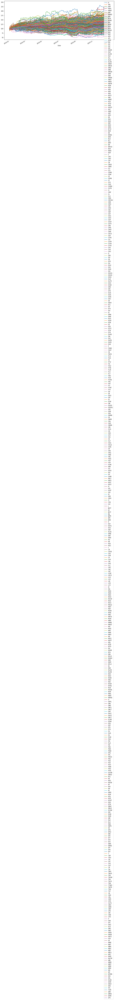

In [74]:
    # COMPARE ALL STOCKS AS IF ALL STARTING FROM THE SAME VALUE '100'
(mydata / mydata.iloc[0] * 100).plot(figsize=(15,6))
plt.show()

In [75]:
    # .loc requirements = 'dates'

mydata.loc['2019-01-02']

A        65.134018
AAL      31.963160
AAP     157.679230
AAPL    155.214005
ABBV     83.331375
           ...    
YUM      89.536743
ZBH     101.532249
ZBRA    156.240005
ZION     40.154263
ZTS      83.823868
Name: 2019-01-02 00:00:00, Length: 505, dtype: float64

In [105]:
Port_RoR = (mydata / mydata.shift(1))-1

Port_RoR



,A,AAL,AAP,AAPL,ABBV,ABC,ABMD,ABT,ACN,ADBE,ADI,ADM,ADP,ADS,ADSK,AEE,AEP,AES,AFL,AGN,AIG,AIV,AIZ,AJG,AKAM,...,WEC,WELL,WFC,WHR,WLTW,WM,WMB,WMT,WRB,WRK,WU,WY,WYNN,XEC,XEL,XLNX,XOM,XRAY,XRX,XYL,YUM,ZBH,ZBRA,ZION,ZTS
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2019-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-01-03,-0.036840,-0.074507,0.031218,-0.099607,-0.032949,-0.014506,-0.024745,-0.047194,-0.034142,-0.039498,-0.060405,-0.004396,-0.030198,-0.025293,-0.055133,0.002518,-0.002331,-0.000705,-0.025264,0.001398,-0.021959,0.008737,-0.015982,-0.018779,-0.022200,...,0.002663,0.018428,-0.007882,-0.003336,-0.020978,-0.002705,0.008475,-0.005142,-0.016570,-0.016971,-0.015752,0.033906,-0.009674,-0.013873,-0.003940,-0.037651,-0.015354,0.000528,-0.021858,-0.034281,-0.025153,-0.018087,-0.059908,-0.005532,-0.034565
2019-01-04,0.034614,0.065868,-0.024808,0.042689,0.032217,0.011585,0.036885,0.028541,0.038884,0.048632,0.024278,0.023056,0.039854,0.067679,0.052770,0.014131,0.009207,0.033169,0.012396,0.047769,0.036903,0.003511,0.020189,0.025234,0.029116,...,0.007379,-0.003648,0.029633,0.048903,0.027023,0.026560,0.041575,0.006246,0.015445,0.043160,0.013041,0.034142,0.040333,0.049968,0.009786,0.046303,0.036870,0.029016,0.038598,0.042192,0.026027,0.034153,0.041462,0.030713,0.039235
2019-01-07,0.021234,0.028402,0.014672,-0.002226,0.014595,0.007141,0.004339,0.014976,0.003473,0.013573,0.006288,0.005035,-0.005410,-0.000062,0.034612,-0.011457,-0.005583,0.004781,0.005343,-0.000912,0.005724,0.000700,0.003980,-0.002904,0.031324,...,-0.004542,0.011863,-0.006465,0.029162,0.007375,0.002422,0.025478,0.011772,0.002904,0.001755,-0.002926,0.019983,0.017758,0.022024,-0.004330,0.026415,0.005200,0.017944,0.021516,-0.014789,-0.001093,0.000385,0.015166,0.003989,0.006017
2019-01-08,0.014660,-0.016085,-0.006951,0.019063,0.004648,0.010702,0.011499,-0.012006,0.025290,0.014918,0.024396,0.018607,0.005899,0.017379,0.008665,0.015818,0.012324,0.023113,0.003100,0.022185,0.003960,0.027506,0.001211,0.004438,0.019758,...,0.010302,0.017658,-0.002099,0.022479,0.006398,0.014168,0.029814,0.006981,-0.007307,-0.002753,0.001761,0.005963,0.031333,0.016124,0.011597,-0.019051,0.007271,-0.006799,0.033030,0.009401,-0.001970,-0.022425,0.006697,0.009114,0.014894
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-12-24,0.000469,-0.004096,0.003751,0.000951,-0.004432,-0.002103,0.010913,-0.000801,0.003700,0.002098,0.004615,0.001304,-0.000647,-0.004306,0.005412,0.001454,0.000960,-0.003027,0.004187,-0.000574,-0.000589,0.005746,0.008520,0.003183,-0.002095,...,0.001530,0.001002,0.000186,-0.002062,0.002034,-0.002746,-0.004177,0.004033,0.000292,-0.009727,-0.002579,-0.009622,-0.005634,0.002288,0.003913,-0.004146,-0.003841,0.000525,0.000535,-0.003927,0.005210,-0.002447,-0.009348,0.003701,0.004155
2019-12-26,0.001758,0.016792,-0.008096,0.019840,-0.000223,-0.004331,-0.007487,0.000000,0.002079,0.004732,0.000084,0.002604,0.002590,-0.005946,0.001794,-0.001452,0.000426,0.008603,-0.002653,0.000836,-0.006282,0.001379,0.000310,-0.000106,0.007115,...,0.001419,0.006881,0.006132,0.000069,0.000149,0.005151,-0.001258,0.000084,0.000731,0.004911,0.008127,0.004690,0.010757,-0.006088,-0.001114,0.001929,0.001571,-0.010156,0.002944,-0.000509,0.014552,-0.002191,0.000354,0.002523,0.000828
2019-12-27,-0.000351,-0.041456,-0.005776,-0.000380,-0.007013,-0.001646,-0.010175,0.001375,0.000802,-0.001238,-0.002339,0.002164,0.002466,0.005257,0.006188,0.008726,0.003302,0.002509,0.000000,-0.000940,0.008890,0.008263,0.004571,0.002115,0.001853,...,0.006104,0.005964,-0.004248,0.005028,-0.001287,0.006273,-0.009240,0.000586,0.001460,-0.007680,0.002931,-0.000333,-0.008018,-0.006317,0.005256,-0.002635,-0.003422,0.0

In [106]:
    # AVERAGE ANNUAL MEAN RATE OF RETURN
A_Port_RoR['S_M_RoR'] = Port_RoR.mean()*250
A_Port_RoR=pd.DataFrame(A_Port_RoR['S_M_RoR'])
A_Port_RoR

,S_M_RoR
A,0.298734
AAL,-0.048763
AAP,0.050586
AAPL,0.667666
ABBV,0.084926
...,...
YUM,0.124889
ZBH,0.410260
ZBRA,0.561139
ZION,0.280021


In [110]:
    # ADD WEIGHTS INTO POSITONS
A_Port_RoR['Weights']=0.0198
A_Port_RoR['Port_RoR']=Port_RoR.mean()*250

np.dot(Port_RoR, weights)
A_Port_RoR

,S_M_RoR,Weights,Port_RoR
A,0.298734,0.0198,0.298734
AAL,-0.048763,0.0198,-0.048763
AAP,0.050586,0.0198,0.050586
AAPL,0.667666,0.0198,0.667666
ABBV,0.084926,0.0198,0.084926
...,...,...,...
YUM,0.124889,0.0198,0.124889
ZBH,0.410260,0.0198,0.410260
ZBRA,0.561139,0.0198,0.561139
ZION,0.280021,0.0198,0.280021


In [124]:
PORT=np.dot(A_Port_RoR, weights)
PORT

A_Port_RoR['PORT']=PORT

A_Port_RoR

,S_M_RoR,Weights,Port_RoR,PORT
A,0.298734,0.0198,0.298734,0.005915
AAL,-0.048763,0.0198,-0.048763,-0.000966
AAP,0.050586,0.0198,0.050586,0.001002
AAPL,0.667666,0.0198,0.667666,0.013220
ABBV,0.084926,0.0198,0.084926,0.001682
...,...,...,...,...
YUM,0.124889,0.0198,0.124889,0.002473
ZBH,0.410260,0.0198,0.410260,0.008123
ZBRA,0.561139,0.0198,0.561139,0.011111
ZION,0.280021,0.0198,0.280021,0.005544


In [134]:
    # CALC LOG RETURNS
sec_RoR = np.log(data / data.shift(1))

sec_RoR=sec_RoR['Adj Close']
sec_RoR

<ipython-input-134-9042cf5cf956>:2: RuntimeWarning:

divide by zero encountered in log



,A,AAL,AAP,AAPL,ABBV,ABC,ABMD,ABT,ACN,ADBE,ADI,ADM,ADP,ADS,ADSK,AEE,AEP,AES,AFL,AGN,AIG,AIV,AIZ,AJG,AKAM,...,WEC,WELL,WFC,WHR,WLTW,WM,WMB,WMT,WRB,WRK,WU,WY,WYNN,XEC,XEL,XLNX,XOM,XRAY,XRX,XYL,YUM,ZBH,ZBRA,ZION,ZTS
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2019-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-01-03,-0.037535,-0.077429,0.030741,-0.104924,-0.033504,-0.014613,-0.025056,-0.048344,-0.034738,-0.040299,-0.062306,-0.004405,-0.030663,-0.025618,-0.056712,0.002515,-0.002334,-0.000706,-0.025588,0.001397,-0.022203,0.008699,-0.016111,-0.018957,-0.022450,...,0.002660,0.018260,-0.007914,-0.003341,-0.021201,-0.002709,0.008439,-0.005156,-0.016709,-0.017117,-0.015878,0.033344,-0.009722,-0.013970,-0.003948,-0.038378,-0.015473,0.000528,-0.022100,-0.034882,-0.025475,-0.018253,-0.061777,-0.005547,-0.035176
2019-01-04,0.034028,0.063790,-0.025121,0.041803,0.031709,0.011518,0.036221,0.028142,0.038147,0.047487,0.023988,0.022794,0.039081,0.065487,0.051425,0.014032,0.009165,0.032631,0.012319,0.046664,0.036239,0.003505,0.019988,0.024921,0.028700,...,0.007352,-0.003655,0.029202,0.047745,0.026665,0.026213,0.040734,0.006227,0.015327,0.042254,0.012957,0.033572,0.039541,0.048759,0.009738,0.045263,0.036206,0.028603,0.037872,0.041326,0.025694,0.033583,0.040626,0.030251,0.038485
2019-01-07,0.021012,0.028006,0.014565,-0.002228,0.014490,0.007116,0.004330,0.014865,0.003467,0.013481,0.006269,0.005022,-0.005425,-0.000062,0.034026,-0.011523,-0.005598,0.004770,0.005329,-0.000912,0.005708,0.000700,0.003972,-0.002908,0.030843,...,-0.004552,0.011793,-0.006486,0.028744,0.007348,0.002419,0.025158,0.011703,0.002900,0.001754,-0.002930,0.019786,0.017602,0.021785,-0.004339,0.026072,0.005187,0.017785,0.021288,-0.014900,-0.001094,0.000385,0.015052,0.003981,0.005999
2019-01-08,0.014553,-0.016216,-0.006975,0.018884,0.004637,0.010645,0.011434,-0.012079,0.024975,0.014807,0.024103,0.018436,0.005882,0.017230,0.008627,0.015695,0.012248,0.022850,0.003095,0.021942,0.003952,0.027134,0.001211,0.004428,0.019566,...,0.010249,0.017504,-0.002101,0.022230,0.006378,0.014069,0.029378,0.006957,-0.007334,-0.002757,0.001759,0.005945,0.030852,0.015996,0.011530,-0.019235,0.007244,-0.006823,0.032497,0.009357,-0.001972,-0.022681,0.006675,0.009073,0.014784
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-12-24,0.000469,-0.004104,0.003744,0.000950,-0.004442,-0.002105,0.010854,-0.000802,0.003693,0.002095,0.004605,0.001303,-0.000647,-0.004315,0.005398,0.001453,0.000959,-0.003032,0.004178,-0.000575,-0.000589,0.005730,0.008484,0.003178,-0.002097,...,0.001529,0.001001,0.000186,-0.002064,0.002032,-0.002749,-0.004186,0.004025,0.000292,-0.009774,-0.002583,-0.009668,-0.005649,0.002286,0.003905,-0.004154,-0.003849,0.000524,0.000535,-0.003934,0.005196,-0.002450,-0.009392,0.003694,0.004146
2019-12-26,0.001757,0.016653,-0.008129,0.019646,-0.000223,-0.004341,-0.007515,0.000000,0.002077,0.004721,0.000084,0.002601,0.002586,-0.005964,0.001793,-0.001453,0.000426,0.008566,-0.002657,0.000836,-0.006302,0.001378,0.000310,-0.000106,0.007090,...,0.001418,0.006858,0.006113,0.000069,0.000149,0.005138,-0.001259,0.000084,0.000731,0.004899,0.008094,0.004679,0.010700,-0.006107,-0.001114,0.001927,0.001570,-0.010208,0.002939,-0.000509,0.014447,-0.002193,0.000354,0.002520,0.000827
2019-12-27,-0.000351,-0.042340,-0.005793,-0.000380,-0.007038,-0.001647,-0.010227,0.001374,0.000801,-0.001239,-0.002341,0.002162,0.002462,0.005243,0.006169,0.008688,0.003297,0.002506,0.000000,-0.000940,0.008851,0.008229,0.004561,0.002113,0.001851,...,0.006085,0.005946,-0.004257,0.005015,-0.001288,0.006254,-0.009283,0.000586,0.001459,-0.007709,0.002927,-0.000334,-0.008050,-0.006337,0.005242,-0.002638,-0.003428,0.0

<ipython-input-153-30e69efafbc9>:3: RuntimeWarning:

divide by zero encountered in log



Adj Close                                                    \
                       A       AAL       AAP      AAPL      ABBV       ABC   
Adj Close A     1.000000  0.327926  0.216229  0.447660  0.304231  0.247675   
          AAL   0.327926  1.000000  0.224031  0.467133  0.179348  0.226272   
          AAP   0.216229  0.224031  1.000000  0.209328  0.130964  0.164260   
          AAPL  0.447660  0.467133  0.209328  1.000000  0.307206  0.210676   
          ABBV  0.304231  0.179348  0.130964  0.307206  1.000000  0.126530   
...                  ...       ...       ...       ...       ...       ...   
Volume    YUM  -0.013484 -0.099986  0.002000 -0.120130  0.001969 -0.001275   
          ZBH  -0.113554 -0.040744 -0.072820 -0.096228  0.008258 -0.024382   
          ZBRA -0.003146  0.081756 -0.080085 -0.117680 -0.089154  0.070526   
          ZION -0.137717 -0.064816 -0.101058 -0.086136 -0.027629  0.067632   
          ZTS  -0.024740 -0.013802 -0.025509 -0.039590 -0.009099  0.001568   

                                                                            \
                    ABMD       ABT       ACN      ADBE       ADI       ADM   
Adj Close A     0.218521  0.561621  0.505177  0.420945  0.477067  0.403138   
          AAL   0.150330  0.315014  0.317921  0.360590  0.478660  0.357486   
          AAP   0.070214  0.163115  0.165612  0.151923  0.166042  0.175344   
          AAPL  0.272637  0.469394  0.511111  0.509405  0.552867  0.434098   
          ABBV  0.147897  0.335214  0.286372  0.334365  0.263424  0.215548   
...                  ...       ...       ...       ...       ...       ...   
Volume    YUM  -0.072620  0.034730 -0.035066 -0.077041 -0.035544 -0.042792   
          ZBH  -0.065067 -0.173947 -0.012504 -0.047215 -0.033392 -0.071267   
          ZBRA -0.003027 -0.035539 -0.017722 -0.059737 -0.043189 -0.006707   
          ZION -0.153145 -0.196663 -0.225888 -0.092737 -0.067225 -0.071093   
          ZTS   0.026003 -0.038106 -0.016511 -0.021509  0.020082 -0.037472   

                                                                            \
                     ADP       ADS      ADSK       AEE       AEP       AES   
Adj Close A     0.477292  0.319842  0.421041  0.176540  0.155209  0.316309   
          AAL   0.346212  0.317154  0.356830 -0.050591 -0.049271  0.143015   
          AAP   0.164930  0.124384  0.155341  0.048117  0.044908  0.184526   
          AAPL  0.492274  0.336200  0.541745  0.023380  0.003308  0.251494   
          ABBV  0.289884  0.167678  0.307767  0.104924  0.077814  0.259383   
...                  ...       ...       ...       ...       ...       ...   
Volume    YUM   0.012629  0.009647 -0.040011  0.117243  0.045717  0.023223   
          ZBH  -0.030641 -0.058238 -0.064637  0.023749  0.012999  0.048611   
          ZBRA  0.039258 -0.022190 -0.025901  0.092341  0.056387  0.049763   
          ZION -0.138580  0.016736 -0.072587 -0.061762 -0.065116 -0.054375   
          ZTS  -0.015464  0.057624 -0.019507  0.020682 -0.027437 -0.016202   

                                                                            \
                     AFL       AGN       AIG       AIV       AIZ       AJG   
Adj Close A     0.440982  0.204863  0.329285  0.275531  0.346406  0.429842   
          AAL   0.300655  0.080977  0.350004  0.081887  0.266994  0.300449   
          AAP   0.251277  0.102825  0.150909  0.087779  0.164426  0.188829   
          AAPL  0.387992  0.121480  0.310010  0.169060  0.313015  0.393089   
          ABBV  0.224674 -0.236234  0.217012  0.160392  0.190753  0.292032   
...                  ...       ...       ...       ...       ...       ...   
Volume    YUM  -0.113849  0.053720 -0.029107  0.004607  0.030872 -0.063726   
          ZBH  -0.146004  0.023600 -0.059906 -0.113219 -0.066646 -0.096349   
          ZBRA -0.080380  0.082536 -0.161399 -0.061667 -0.051251 -0.062383   
          ZION -0.185831  0.026930 -0.084236 -0.154487 -0.073662 -0.176568   
          ZTS  -0.128190  0.089259

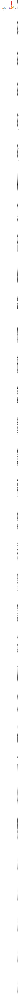

In [153]:
(data / data.iloc[0]*100).plot(figsize = (15,9))

log_returns = np.log(data / data.shift(1))

log_returns.mean()*250

log_returns.cov()*250

log_returns.corr()

# S&P DATA PULL

In [1]:
import bs4 as bs
import pickle
import requests

def save_sp500_tickers():
    resp = requests.get('http://en.wikipedia.org/wiki/List_of_S%26P_500_companies')
    soup = bs.BeautifulSoup(resp.text, 'lxml')
    table = soup.find('table', {'class': 'wikitable sortable'})
    tickers = []
    for row in table.findAll('tr')[1:]:
        ticker = row.findAll('td')[0].text
        tickers.append(ticker)
        
    with open("sp500tickers.pickle","wb") as f:
        pickle.dump(tickers,f)
        
    return tickers

save_sp500_tickers()

['MMM\n',
 'ABT\n',
 'ABBV\n',
 'ABMD\n',
 'ACN\n',
 'ATVI\n',
 'ADBE\n',
 'AMD\n',
 'AAP\n',
 'AES\n',
 'AFL\n',
 'A\n',
 'APD\n',
 'AKAM\n',
 'ALK\n',
 'ALB\n',
 'ARE\n',
 'ALXN\n',
 'ALGN\n',
 'ALLE\n',
 'AGN\n',
 'ADS\n',
 'LNT\n',
 'ALL\n',
 'GOOGL\n',
 'GOOG\n',
 'MO\n',
 'AMZN\n',
 'AMCR\n',
 'AEE\n',
 'AAL\n',
 'AEP\n',
 'AXP\n',
 'AIG\n',
 'T\n',
 'AMT\n',
 'AWK\n',
 'AMP\n',
 'ABC\n',
 'AME\n',
 'AMGN\n',
 'APH\n',
 'ADI\n',
 'ANSS\n',
 'ANTM\n',
 'AON\n',
 'AOS\n',
 'APA\n',
 'AIV\n',
 'AAPL\n',
 'AMAT\n',
 'APTV\n',
 'ADM\n',
 'ARNC\n',
 'ANET\n',
 'AJG\n',
 'AIZ\n',
 'ATO\n',
 'ADSK\n',
 'ADP\n',
 'AZO\n',
 'AVB\n',
 'AVY\n',
 'BKR\n',
 'BLL\n',
 'BAC\n',
 'BK\n',
 'BAX\n',
 'BDX\n',
 'BRK.B\n',
 'BBY\n',
 'BIIB\n',
 'BLK\n',
 'BA\n',
 'BKNG\n',
 'BWA\n',
 'BXP\n',
 'BSX\n',
 'BMY\n',
 'AVGO\n',
 'BR\n',
 'BF.B\n',
 'CHRW\n',
 'COG\n',
 'CDNS\n',
 'CPB\n',
 'COF\n',
 'CPRI\n',
 'CAH\n',
 'KMX\n',
 'CCL\n',
 'CAT\n',
 'CBOE\n',
 'CBRE\n',
 'CDW\n',
 'CE\n',
 'CNC\n',
 'CNP\

In [6]:
import bs4 as bs
import requests
import yfinance as yf
import datetime

resp = requests.get('http://en.wikipedia.org/wiki/List_of_S%26P_500_companies')
soup = bs.BeautifulSoup(resp.text, 'lxml')
table = soup.find('table', {'class': 'wikitable sortable'})
tickers = []
for row in table.findAll('tr')[1:]:
    ticker = row.findAll('td')[0].text
    tickers.append(ticker)

tickers = [s.replace('\n', '') for s in tickers]
start = datetime.datetime(2019,1,1)
end = datetime.datetime(2019,7,17)
data = yf.download(tickers, start=start, end=end)


data=pd.DataFrame(data['Adj Close'])
data

[*********************100%***********************]  505 of 505 completed

2 Failed downloads:
- BF.B: No data found for this date range, symbol may be delisted
- BRK.B: No data found, symbol may be delisted


,A,AAL,AAP,AAPL,ABBV,ABC,ABMD,ABT,ACN,ADBE,ADI,ADM,ADP,ADS,ADSK,AEE,AEP,AES,AFL,AGN,AIG,AIV,AIZ,AJG,AKAM,...,WEC,WELL,WFC,WHR,WLTW,WM,WMB,WMT,WRB,WRK,WU,WY,WYNN,XEC,XEL,XLNX,XOM,XRAY,XRX,XYL,YUM,ZBH,ZBRA,ZION,ZTS
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2019-01-02,65.134018,31.963160,157.679230,155.214005,82.120384,72.719398,309.959991,68.076973,138.303879,224.570007,83.732750,39.252548,127.517586,151.568893,128.960007,61.911411,70.182968,13.631915,44.346638,132.793976,38.630932,40.735397,87.767433,70.486923,59.009998,...,65.252937,63.800819,44.651684,103.390709,147.645950,87.095131,21.122946,91.487152,47.479309,36.635494,16.521799,20.432470,100.250526,61.500988,46.941418,85.283569,65.563515,37.627628,19.535194,65.474289,89.536743,101.532249,156.240005,40.154263,83.823868
2019-01-03,62.734497,29.581665,162.601715,139.753540,79.414642,71.664497,302.290009,64.864136,133.581940,215.699997,78.674881,39.080009,123.666794,147.735291,121.849998,62.067333,70.019386,13.622300,43.226284,132.979675,37.782650,41.091290,86.364716,69.163269,57.700001,...,65.426735,64.976517,44.299721,103.045822,144.548599,86.859543,21.301956,91.016685,46.692577,36.013756,16.261539,21.125257,99.280663,60.647766,46.756454,82.072556,64.556870,37.647484,19.108196,63.229786,87.284607,99.695786,146.880005,39.932148,80.926529
2019-01-04,64.905960,31.530161,158.567856,145.719513,81.973129,72.494736,313.440002,66.715439,138.776093,226.190002,80.584984,39.981045,128.595444,157.733887,128.279999,62.944401,70.664062,14.074135,43.762100,139.332047,39.176952,41.235569,88.108376,70.908539,59.380001,...,65.909515,64.739479,45.612450,108.085068,148.454803,89.166496,22.187574,91.585175,47.413754,37.568104,16.473604,21.846516,103.284927,63.678188,47.213993,85.872749,66.937065,38.739868,19.845737,65.897575,89.556320,103.100700,152.970001,41.158604,84.101685
2019-01-07,66.284187,32.425678,160.894318,145.395203,83.169548,73.012421,314.799988,67.714539,139.258118,229.259995,81.091736,40.182339,127.899734,157.724121,132.720001,62.223259,70.269562,14.141429,43.995918,139.205017,39.401211,41.264431,88.459061,70.702629,61.240002,...,65.610184,65.507477,45.317558,111.236992,149.549713,89.382469,22.752861,92.663338,47.551426,37.634045,16.425406,22.283066,105.119019,65.080627,47.009563,88.141090,67.285156,39.435020,20.272734,64.922997,89.458405,103.140411,155.289993,41.322777,84.607712
2019-01-08,67.255898,31.904110,159.776016,148.166870,83.556091,73.793823,318.420013,66.901543,142.779892,232.679993,83.070061,40.930004,128.654221,160.465195,133.869995,63.207531,71.135544,14.468287,44.132305,142.293243,39.557220,42.399445,88.566216,71.016388,62.450001,...,66.286087,66.664223,45.222435,113.737450,150.506546,90.648842,23.431208,93.310226,47.203953,37.530422,16.454325,22.415932,108.412689,66.129997,47.554714,86.461929,67.774361,39.166885,20.942348,65.533348,89.282150,100.827438,156.330002,41.699402,85.867859
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-07-11,71.435127,32.687084,156.169693,199.910309,67.247902,89.297005,266.089996,84.748840,193.090683,307.600006,112.206390,40.684380,163.505508,145.477798,173.330002,75.692291,88.951118,16.573612,55.496979,163.925934,54.824486,50.444824,108.559174,90.521103,82.290001,...,84.442474,82.619034,45.685852,139.028900,195.025330,116.221764,27.809618,112.855774,66.928703,34.909676,20.089552,25.187668,127.258148,54.155846,60.407471,116.998528,74.632904,56.564266,34.400673,80.410118,110.128372,120.595634,195.009995,44.825573,113.874237
2019-07-12,71.345520,33.429298,158.457947,201.446182,67.353317,88.626266,262.690002,83.231392,194.618195,309.420013,114.452095,40.869614,163.426331,147.080368,174.190002,75.179001,88.285919,16.690878,56.018860,163.807419,55.605156,50.571888,110.028328,90.966881,82.459999,...,83.805130,82.211617,45.899071,142.723221,195.144531,116.875984,27.94

In [112]:
import pandas as pd

data = pd.read_html('https://en.wikipedia.org/wiki/List_of_S%26P_500_companies')

table = data[0]
table


,Symbol,Security,SEC filings,GICS Sector,GICS Sub Industry,Headquarters Location,Date first added,CIK,Founded
0,MMM,3M Company,reports,Industrials,Industrial Conglomerates,"St. Paul, Minnesota",1976-08-09,66740,1902
1,ABT,Abbott Laboratories,reports,Health Care,Health Care Equipment,"North Chicago, Illinois",1964-03-31,1800,1888
2,ABBV,AbbVie Inc.,reports,Health Care,Pharmaceuticals,"North Chicago, Illinois",2012-12-31,1551152,2013 (1888)
3,ABMD,ABIOMED Inc,reports,Health Care,Health Care Equipment,"Danvers, Massachusetts",2018-05-31,815094,1981
4,ACN,Accenture plc,reports,Information Technology,IT Consulting & Other Services,"Dublin, Ireland",2011-07-06,1467373,1989
...,...,...,...,...,...,...,...,...,...
500,YUM,Yum! Brands Inc,reports,Consumer Discretionary,Restaurants,"Louisville, Kentucky",1997-10-06,1041061,NaN
501,ZBRA,Zebra Technologies,reports,Information Technology,Electronic Equipment & Instruments,"Lincolnshire, Illinois",2019-12-23,877212,1969
502,ZBH,Zimmer Biomet Holdings,reports,Health Care,Health Care Equipment,"Warsaw, Indiana",2001-08-07,1136869,NaN
503,ZION,Zions Bancorp,reports,Financials,Regional Banks,"Salt Lake City, Utah",2001-06-22,109380,NaN


In [115]:
import pandas as pd

data = pd.read_html('https://finance.yahoo.com/quote/%5EGSPC/history?ltr=1')

table = data[0]
table



,Date,Open,High,Low,Close*,Adj Close**,Volume
0,"Mar 02, 2020",2974.28,3090.96,2945.19,3090.23,3090.23,6376400000
1,"Feb 28, 2020",2916.90,2959.72,2855.84,2954.22,2954.22,8563850000
2,"Feb 27, 2020",3062.54,3097.07,2977.39,2978.76,2978.76,7058840000
3,"Feb 26, 2020",3139.90,3182.51,3108.99,3116.39,3116.39,5478110000
4,"Feb 25, 2020",3238.94,3246.99,3118.77,3128.21,3128.21,5591510000
...,...,...,...,...,...,...,...
96,"Oct 11, 2019",2963.07,2993.28,2963.07,2970.27,2970.27,3580460000
97,"Oct 10, 2019",2918.55,2948.46,2917.12,2938.13,2938.13,3217250000
98,"Oct 09, 2019",2911.10,2929.32,2907.41,2919.40,2919.40,2726820000
99,"Oct 08, 2019",2920.40,2925.47,2892.66,2893.06,2893.06,3356450000


In [8]:
import pandas as pd
table=pd.read_html('https://en.wikipedia.org/wiki/List_of_S%26P_500_companies')
df = table[0]
df.to_csv('S&P500-Info.csv')
df.to_csv("S&P500-Symbols.csv", columns=['Symbol'])

df

,Symbol,Security,SEC filings,GICS Sector,GICS Sub Industry,Headquarters Location,Date first added,CIK,Founded
0,MMM,3M Company,reports,Industrials,Industrial Conglomerates,"St. Paul, Minnesota",1976-08-09,66740,1902
1,ABT,Abbott Laboratories,reports,Health Care,Health Care Equipment,"North Chicago, Illinois",1964-03-31,1800,1888
2,ABBV,AbbVie Inc.,reports,Health Care,Pharmaceuticals,"North Chicago, Illinois",2012-12-31,1551152,2013 (1888)
3,ABMD,ABIOMED Inc,reports,Health Care,Health Care Equipment,"Danvers, Massachusetts",2018-05-31,815094,1981
4,ACN,Accenture plc,reports,Information Technology,IT Consulting & Other Services,"Dublin, Ireland",2011-07-06,1467373,1989
...,...,...,...,...,...,...,...,...,...
500,YUM,Yum! Brands Inc,reports,Consumer Discretionary,Restaurants,"Louisville, Kentucky",1997-10-06,1041061,NaN
501,ZBRA,Zebra Technologies,reports,Information Technology,Electronic Equipment & Instruments,"Lincolnshire, Illinois",2019-12-23,877212,1969
502,ZBH,Zimmer Biomet Holdings,reports,Health Care,Health Care Equipment,"Warsaw, Indiana",2001-08-07,1136869,NaN
503,ZION,Zions Bancorp,reports,Financials,Regional Banks,"Salt Lake City, Utah",2001-06-22,109380,NaN


# new

In [22]:
# Import initial libraries

import pandas as pd
import numpy as np
import datetime
import matplotlib.pyplot as plt
%matplotlib inline

In [23]:
# Imports in order to be able to use Plotly offline.
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

import plotly.graph_objs as go

print(__version__) # requires version >= 1.9.0

init_notebook_mode(connected=True)

4.5.1


In [26]:
# Import the Sample worksheet with acquisition dates and initial cost basis:

portfolio_df = pd.read_excel(r'C:/Users/gordo/Programming/Data_Bank/sample/Sample stocks acquisition dates_costs.xlsx')

portfolio_df.head(10)

,Acquisition Date,Ticker,Quantity,Unit Cost,Cost Basis,Start of Year
0,2013-02-07,AAPL,125,65.40,8175.00,2017-12-29
1,2014-02-27,JNJ,100,81.90,8190.00,2017-12-29
2,2013-06-04,MCD,100,84.99,8499.00,2017-12-29
3,2015-12-14,MTCH,600,13.63,8178.00,2017-12-29
4,2016-01-14,NFLX,75,108.71,8153.25,2017-12-29
5,2013-08-14,WMT,125,68.30,8537.50,2017-12-29
6,2013-12-13,FB,150,53.32,7998.00,2017-12-29
7,2015-01-05,TWTR,225,36.38,8185.50,2017-12-29


In [27]:
# Confirm that you have 8 values for each column.

portfolio_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8 entries, 0 to 7
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Acquisition Date  8 non-null      datetime64[ns]
 1   Ticker            8 non-null      object        
 2   Quantity          8 non-null      int64         
 3   Unit Cost         8 non-null      float64       
 4   Cost Basis        8 non-null      float64       
 5   Start of Year     8 non-null      datetime64[ns]
dtypes: datetime64[ns](2), float64(2), int64(1), object(1)
memory usage: 512.0+ bytes


In [28]:
# Date Ranges for SP 500 and for all tickers
# Modify these date ranges each week.

# The below will pull back stock prices from 2010 until end date specified.
start_sp = datetime.datetime(2013, 1, 1)
end_sp = datetime.datetime(2018, 3, 1)

# This variable is used for YTD performance.
end_of_last_year = datetime.datetime(2017, 12, 29)

# These are separate if for some reason want different date range than SP.
stocks_start = datetime.datetime(2013, 1, 1)
stocks_end = datetime.datetime(2018, 3, 1)

In [30]:
# Leveraged from the helpful Datacamp Python Finance trading blog post.

from pandas_datareader import data as pdr
import yfinance as yf
yf.pdr_override() # <== that's all it takes :-)

sp500 = pdr.get_data_yahoo('^GSPC', 
                           start_sp,
                             end_sp)
                          
sp500.head()

[*********************100%***********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2013-01-02,1426.189941,1462.430054,1426.189941,1462.420044,1462.420044,4202600000
2013-01-03,1462.420044,1465.469971,1455.530029,1459.369995,1459.369995,3829730000
2013-01-04,1459.369995,1467.939941,1458.989990,1466.469971,1466.469971,3424290000
2013-01-07,1466.469971,1466.469971,1456.619995,1461.890015,1461.890015,3304970000
2013-01-08,1461.890015,1461.890015,1451.640015,1457.150024,1457.150024,3601600000


In [31]:
sp500.tail()


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2018-02-23,2715.800049,2747.760010,2713.739990,2747.300049,2747.300049,3189190000
2018-02-26,2757.370117,2780.639893,2753.780029,2779.600098,2779.600098,3424650000
2018-02-27,2780.449951,2789.149902,2744.219971,2744.280029,2744.280029,3745080000
2018-02-28,2753.780029,2761.520020,2713.540039,2713.830078,2713.830078,4230660000
2018-03-01,2715.219971,2730.889893,2659.649902,2677.669922,2677.669922,4503970000


In [32]:
# Create a dataframe with only the Adj Close column as that's all we need for this analysis.

sp_500_adj_close = sp500[['Adj Close']].reset_index()

In [33]:
sp_500_adj_close.tail()


,Date,Adj Close
1295,2018-02-23,2747.300049
1296,2018-02-26,2779.600098
1297,2018-02-27,2744.280029
1298,2018-02-28,2713.830078
1299,2018-03-01,2677.669922


In [34]:
# Adj Close for the EOY in 2017 in order to run comparisons versus stocks YTD performances.

sp_500_adj_close_start = sp_500_adj_close[sp_500_adj_close['Date']==end_of_last_year]
sp_500_adj_close_start

,Date,Adj Close
1258,2017-12-29,2673.610107


In [35]:
# Generate a dynamic list of tickers to pull from Yahoo Finance API based on the imported file with tickers.
tickers = portfolio_df['Ticker'].unique()
tickers

array(['AAPL', 'JNJ', 'MCD', 'MTCH', 'NFLX', 'WMT', 'FB', 'TWTR'],
      dtype=object)

In [36]:
# Stock comparison code

def get(tickers, startdate, enddate):
    def data(ticker):
        return (pdr.get_data_yahoo(ticker, start=startdate, end=enddate))
    datas = map(data, tickers)
    return(pd.concat(datas, keys=tickers, names=['Ticker', 'Date']))
               
all_data = get(tickers, stocks_start, stocks_end)

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


In [37]:
all_data.head()


Open       High        Low      Close  Adj Close  \
Ticker Date                                                                
AAPL   2013-01-02  79.117142  79.285713  77.375717  78.432854  68.687538   
       2013-01-03  78.268570  78.524284  77.285713  77.442856  67.820526   
       2013-01-04  76.709999  76.947144  75.118568  75.285713  65.931404   
       2013-01-07  74.571426  75.614288  73.599998  74.842857  65.543602   
       2013-01-08  75.601425  75.984283  74.464287  75.044289  65.719994   

                      Volume  
Ticker Date                   
AAPL   2013-01-02  140129500  
       2013-01-03   88241300  
       2013-01-04  148583400  
       2013-01-07  121039100  
       2013-01-08  114676800

In [38]:
# Also only pulling the ticker, date and adj. close columns for our tickers.

adj_close = all_data[['Adj Close']].reset_index()
adj_close.head()

,Ticker,Date,Adj Close
0,AAPL,2013-01-02,68.687538
1,AAPL,2013-01-03,67.820526
2,AAPL,2013-01-04,65.931404
3,AAPL,2013-01-07,65.543602
4,AAPL,2013-01-08,65.719994


In [39]:
# Grabbing the ticker close from the end of last year
adj_close_start = adj_close[adj_close['Date']==end_of_last_year]
adj_close_start.head()

,Ticker,Date,Adj Close
1258,AAPL,2017-12-29,163.869995
2558,JNJ,2017-12-29,131.462616
3858,MCD,2017-12-29,162.893448
4431,MTCH,2017-12-29,29.799627
5731,NFLX,2017-12-29,191.960007


In [40]:
# Grab the latest stock close price

adj_close_latest = adj_close[adj_close['Date']==stocks_end]
adj_close_latest

,Ticker,Date,Adj Close
1299,AAPL,2018-03-01,170.148117
2599,JNJ,2018-03-01,120.524673
3899,MCD,2018-03-01,148.285843
4472,MTCH,2018-03-01,37.423229
5772,NFLX,2018-03-01,290.390015
7072,WMT,2018-03-01,85.287392
8372,FB,2018-03-01,175.940002
9457,TWTR,2018-03-01,32.240002


In [41]:
adj_close_latest.set_index('Ticker', inplace=True)
adj_close_latest.head()

,Date,Adj Close
Ticker,,
AAPL,2018-03-01,170.148117
JNJ,2018-03-01,120.524673
MCD,2018-03-01,148.285843
MTCH,2018-03-01,37.423229
NFLX,2018-03-01,290.390015


In [42]:
portfolio_df.set_index(['Ticker'], inplace=True)

portfolio_df.head()

,Acquisition Date,Quantity,Unit Cost,Cost Basis,Start of Year
Ticker,,,,,
AAPL,2013-02-07,125,65.40,8175.00,2017-12-29
JNJ,2014-02-27,100,81.90,8190.00,2017-12-29
MCD,2013-06-04,100,84.99,8499.00,2017-12-29
MTCH,2015-12-14,600,13.63,8178.00,2017-12-29
NFLX,2016-01-14,75,108.71,8153.25,2017-12-29


In [43]:
# Merge the portfolio dataframe with the adj close dataframe; they are being joined by their indexes.

merged_portfolio = pd.merge(portfolio_df, adj_close_latest, left_index=True, right_index=True)
merged_portfolio.head()

,Acquisition Date,Quantity,Unit Cost,Cost Basis,Start of Year,Date,Adj Close
Ticker,,,,,,,
AAPL,2013-02-07,125,65.40,8175.00,2017-12-29,2018-03-01,170.148117
JNJ,2014-02-27,100,81.90,8190.00,2017-12-29,2018-03-01,120.524673
MCD,2013-06-04,100,84.99,8499.00,2017-12-29,2018-03-01,148.285843
MTCH,2015-12-14,600,13.63,8178.00,2017-12-29,2018-03-01,37.423229
NFLX,2016-01-14,75,108.71,8153.25,2017-12-29,2018-03-01,290.390015


In [44]:
# The below creates a new column which is the ticker return; takes the latest adjusted close for each position
# and divides that by the initial share cost.

merged_portfolio['ticker return'] = merged_portfolio['Adj Close'] / merged_portfolio['Unit Cost'] - 1

merged_portfolio

,Acquisition Date,Quantity,Unit Cost,Cost Basis,Start of Year,Date,Adj Close,ticker return
Ticker,,,,,,,,
AAPL,2013-02-07,125,65.40,8175.00,2017-12-29,2018-03-01,170.148117,1.601653
JNJ,2014-02-27,100,81.90,8190.00,2017-12-29,2018-03-01,120.524673,0.471608
MCD,2013-06-04,100,84.99,8499.00,2017-12-29,2018-03-01,148.285843,0.744745
MTCH,2015-12-14,600,13.63,8178.00,2017-12-29,2018-03-01,37.423229,1.745651
NFLX,2016-01-14,75,108.71,8153.25,2017-12-29,2018-03-01,290.390015,1.671236
WMT,2013-08-14,125,68.30,8537.50,2017-12-29,2018-03-01,85.287392,0.248717
FB,2013-12-13,150,53.32,7998.00,2017-12-29,2018-03-01,175.940002,2.299700
TWTR,2015-01-05,225,36.38,8185.50,2017-12-29,2018-03-01,32.240002,-0.113799


In [45]:
merged_portfolio.reset_index(inplace=True)


In [46]:
# Here we are merging the new dataframe with the sp500 adjusted closes since the sp start price based on 
# each ticker's acquisition date and sp500 close date.

merged_portfolio_sp = pd.merge(merged_portfolio, sp_500_adj_close, left_on='Acquisition Date', right_on='Date')
# .set_index('Ticker')

merged_portfolio_sp.head()

,Ticker,Acquisition Date,Quantity,Unit Cost,Cost Basis,Start of Year,Date_x,Adj Close_x,ticker return,Date_y,Adj Close_y
0,AAPL,2013-02-07,125,65.40,8175.00,2017-12-29,2018-03-01,170.148117,1.601653,2013-02-07,1509.390015
1,JNJ,2014-02-27,100,81.90,8190.00,2017-12-29,2018-03-01,120.524673,0.471608,2014-02-27,1854.290039
2,MCD,2013-06-04,100,84.99,8499.00,2017-12-29,2018-03-01,148.285843,0.744745,2013-06-04,1631.380005
3,MTCH,2015-12-14,600,13.63,8178.00,2017-12-29,2018-03-01,37.423229,1.745651,2015-12-14,2021.939941
4,NFLX,2016-01-14,75,108.71,8153.25,2017-12-29,2018-03-01,290.390015,1.671236,2016-01-14,1921.839966


In [47]:
# We will delete the additional date column which is created from this merge.
# We then rename columns to Latest Date and then reflect Ticker Adj Close and SP 500 Initial Close.

del merged_portfolio_sp['Date_y']

merged_portfolio_sp.rename(columns={'Date_x': 'Latest Date', 'Adj Close_x': 'Ticker Adj Close'
                                    , 'Adj Close_y': 'SP 500 Initial Close'}, inplace=True)

merged_portfolio_sp.head()

,Ticker,Acquisition Date,Quantity,Unit Cost,Cost Basis,Start of Year,Latest Date,Ticker Adj Close,ticker return,SP 500 Initial Close
0,AAPL,2013-02-07,125,65.40,8175.00,2017-12-29,2018-03-01,170.148117,1.601653,1509.390015
1,JNJ,2014-02-27,100,81.90,8190.00,2017-12-29,2018-03-01,120.524673,0.471608,1854.290039
2,MCD,2013-06-04,100,84.99,8499.00,2017-12-29,2018-03-01,148.285843,0.744745,1631.380005
3,MTCH,2015-12-14,600,13.63,8178.00,2017-12-29,2018-03-01,37.423229,1.745651,2021.939941
4,NFLX,2016-01-14,75,108.71,8153.25,2017-12-29,2018-03-01,290.390015,1.671236,1921.839966


In [48]:
# This new column determines what SP 500 equivalent purchase would have been at purchase date of stock.
merged_portfolio_sp['Equiv SP Shares'] = merged_portfolio_sp['Cost Basis'] / merged_portfolio_sp['SP 500 Initial Close']
merged_portfolio_sp.head()

,Ticker,Acquisition Date,Quantity,Unit Cost,Cost Basis,Start of Year,Latest Date,Ticker Adj Close,ticker return,SP 500 Initial Close,Equiv SP Shares
0,AAPL,2013-02-07,125,65.40,8175.00,2017-12-29,2018-03-01,170.148117,1.601653,1509.390015,5.416095
1,JNJ,2014-02-27,100,81.90,8190.00,2017-12-29,2018-03-01,120.524673,0.471608,1854.290039,4.416785
2,MCD,2013-06-04,100,84.99,8499.00,2017-12-29,2018-03-01,148.285843,0.744745,1631.380005,5.209700
3,MTCH,2015-12-14,600,13.63,8178.00,2017-12-29,2018-03-01,37.423229,1.745651,2021.939941,4.044631
4,NFLX,2016-01-14,75,108.71,8153.25,2017-12-29,2018-03-01,290.390015,1.671236,1921.839966,4.242419


In [49]:
# We are joining the developing dataframe with the sp500 closes again, this time with the latest close for SP.
merged_portfolio_sp_latest = pd.merge(merged_portfolio_sp, sp_500_adj_close, left_on='Latest Date', right_on='Date')

merged_portfolio_sp_latest.head()

,Ticker,Acquisition Date,Quantity,Unit Cost,Cost Basis,Start of Year,Latest Date,Ticker Adj Close,ticker return,SP 500 Initial Close,Equiv SP Shares,Date,Adj Close
0,AAPL,2013-02-07,125,65.40,8175.00,2017-12-29,2018-03-01,170.148117,1.601653,1509.390015,5.416095,2018-03-01,2677.669922
1,JNJ,2014-02-27,100,81.90,8190.00,2017-12-29,2018-03-01,120.524673,0.471608,1854.290039,4.416785,2018-03-01,2677.669922
2,MCD,2013-06-04,100,84.99,8499.00,2017-12-29,2018-03-01,148.285843,0.744745,1631.380005,5.209700,2018-03-01,2677.669922
3,MTCH,2015-12-14,600,13.63,8178.00,2017-12-29,2018-03-01,37.423229,1.745651,2021.939941,4.044631,2018-03-01,2677.669922
4,NFLX,2016-01-14,75,108.71,8153.25,2017-12-29,2018-03-01,290.390015,1.671236,1921.839966,4.242419,2018-03-01,2677.669922


In [50]:
# Once again need to delete the new Date column added as it's redundant to Latest Date.  
# Modify Adj Close from the sp dataframe to distinguish it by calling it the SP 500 Latest Close.

del merged_portfolio_sp_latest['Date']

merged_portfolio_sp_latest.rename(columns={'Adj Close': 'SP 500 Latest Close'}, inplace=True)

merged_portfolio_sp_latest.head()

,Ticker,Acquisition Date,Quantity,Unit Cost,Cost Basis,Start of Year,Latest Date,Ticker Adj Close,ticker return,SP 500 Initial Close,Equiv SP Shares,SP 500 Latest Close
0,AAPL,2013-02-07,125,65.40,8175.00,2017-12-29,2018-03-01,170.148117,1.601653,1509.390015,5.416095,2677.669922
1,JNJ,2014-02-27,100,81.90,8190.00,2017-12-29,2018-03-01,120.524673,0.471608,1854.290039,4.416785,2677.669922
2,MCD,2013-06-04,100,84.99,8499.00,2017-12-29,2018-03-01,148.285843,0.744745,1631.380005,5.209700,2677.669922
3,MTCH,2015-12-14,600,13.63,8178.00,2017-12-29,2018-03-01,37.423229,1.745651,2021.939941,4.044631,2677.669922
4,NFLX,2016-01-14,75,108.71,8153.25,2017-12-29,2018-03-01,290.390015,1.671236,1921.839966,4.242419,2677.669922


In [51]:
# Percent return of SP from acquisition date of position through latest trading day.
merged_portfolio_sp_latest['SP Return'] = merged_portfolio_sp_latest['SP 500 Latest Close'] / merged_portfolio_sp_latest['SP 500 Initial Close'] - 1

# This is a new column which takes the tickers return and subtracts the sp 500 equivalent range return.
merged_portfolio_sp_latest['Abs. Return Compare'] = merged_portfolio_sp_latest['ticker return'] - merged_portfolio_sp_latest['SP Return']

# This is a new column where we calculate the ticker's share value by multiplying the original quantity by the latest close.
merged_portfolio_sp_latest['Ticker Share Value'] = merged_portfolio_sp_latest['Quantity'] * merged_portfolio_sp_latest['Ticker Adj Close']

# We calculate the equivalent SP 500 Value if we take the original SP shares * the latest SP 500 share price.
merged_portfolio_sp_latest['SP 500 Value'] = merged_portfolio_sp_latest['Equiv SP Shares'] * merged_portfolio_sp_latest['SP 500 Latest Close']

# This is a new column where we take the current market value for the shares and subtract the SP 500 value.
merged_portfolio_sp_latest['Abs Value Compare'] = merged_portfolio_sp_latest['Ticker Share Value'] - merged_portfolio_sp_latest['SP 500 Value']

# This column calculates profit / loss for stock position.
merged_portfolio_sp_latest['Stock Gain / (Loss)'] = merged_portfolio_sp_latest['Ticker Share Value'] - merged_portfolio_sp_latest['Cost Basis']

# This column calculates profit / loss for SP 500.
merged_portfolio_sp_latest['SP 500 Gain / (Loss)'] = merged_portfolio_sp_latest['SP 500 Value'] - merged_portfolio_sp_latest['Cost Basis']

merged_portfolio_sp_latest.head()

,Ticker,Acquisition Date,Quantity,Unit Cost,Cost Basis,Start of Year,Latest Date,Ticker Adj Close,ticker return,SP 500 Initial Close,Equiv SP Shares,SP 500 Latest Close,SP Return,Abs. Return Compare,Ticker Share Value,SP 500 Value,Abs Value Compare,Stock Gain / (Loss),SP 500 Gain / (Loss)
0,AAPL,2013-02-07,125,65.40,8175.00,2017-12-29,2018-03-01,170.148117,1.601653,1509.390015,5.416095,2677.669922,0.774008,0.827645,21268.514633,14502.515188,6765.999446,13093.514633,6327.515188
1,JNJ,2014-02-27,100,81.90,8190.00,2017-12-29,2018-03-01,120.524673,0.471608,1854.290039,4.416785,2677.669922,0.444041,0.027567,12052.467346,11826.691725,225.775622,3862.467346,3636.691725
2,MCD,2013-06-04,100,84.99,8499.00,2017-12-29,2018-03-01,148.285843,0.744745,1631.380005,5.209700,2677.669922,0.641353,0.103392,14828.584290,13949.856317,878.727973,6329.584290,5450.856317
3,MTCH,2015-12-14,600,13.63,8178.00,2017-12-29,2018-03-01,37.423229,1.745651,2021.939941,4.044631,2677.669922,0.324307,1.421344,22453.937531,10830.185493,11623.752038,14275.937531,2652.185493
4,NFLX,2016-01-14,75,108.71,8153.25,2017-12-29,2018-03-01,290.390015,1.671236,1921.839966,4.242419,2677.669922,0.393285,1.277951,21779.251099,11359.797215,10419.453884,13626.001099,3206.547215


In [52]:
# Merge the overall dataframe with the adj close start of year dataframe for YTD tracking of tickers.
# Should not need to do the outer join;

merged_portfolio_sp_latest_YTD = pd.merge(merged_portfolio_sp_latest, adj_close_start, on='Ticker')
# , how='outer'

merged_portfolio_sp_latest_YTD.head()

,Ticker,Acquisition Date,Quantity,Unit Cost,Cost Basis,Start of Year,Latest Date,Ticker Adj Close,ticker return,SP 500 Initial Close,Equiv SP Shares,SP 500 Latest Close,SP Return,Abs. Return Compare,Ticker Share Value,SP 500 Value,Abs Value Compare,Stock Gain / (Loss),SP 500 Gain / (Loss),Date,Adj Close
0,AAPL,2013-02-07,125,65.40,8175.00,2017-12-29,2018-03-01,170.148117,1.601653,1509.390015,5.416095,2677.669922,0.774008,0.827645,21268.514633,14502.515188,6765.999446,13093.514633,6327.515188,2017-12-29,163.869995
1,JNJ,2014-02-27,100,81.90,8190.00,2017-12-29,2018-03-01,120.524673,0.471608,1854.290039,4.416785,2677.669922,0.444041,0.027567,12052.467346,11826.691725,225.775622,3862.467346,3636.691725,2017-12-29,131.462616
2,MCD,2013-06-04,100,84.99,8499.00,2017-12-29,2018-03-01,148.285843,0.744745,1631.380005,5.209700,2677.669922,0.641353,0.103392,14828.584290,13949.856317,878.727973,6329.584290,5450.856317,2017-12-29,162.893448
3,MTCH,2015-12-14,600,13.63,8178.00,2017-12-29,2018-03-01,37.423229,1.745651,2021.939941,4.044631,2677.669922,0.324307,1.421344,22453.937531,10830.185493,11623.752038,14275.937531,2652.185493,2017-12-29,29.799627
4,NFLX,2016-01-14,75,108.71,8153.25,2017-12-29,2018-03-01,290.390015,1.671236,1921.839966,4.242419,2677.669922,0.393285,1.277951,21779.251099,11359.797215,10419.453884,13626.001099,3206.547215,2017-12-29,191.960007


In [53]:
# Deleting date again as it's an unnecessary column.  Explaining that new column is the Ticker Start of Year Close.

del merged_portfolio_sp_latest_YTD['Date']

merged_portfolio_sp_latest_YTD.rename(columns={'Adj Close': 'Ticker Start Year Close'}, inplace=True)

merged_portfolio_sp_latest_YTD.head()

,Ticker,Acquisition Date,Quantity,Unit Cost,Cost Basis,Start of Year,Latest Date,Ticker Adj Close,ticker return,SP 500 Initial Close,Equiv SP Shares,SP 500 Latest Close,SP Return,Abs. Return Compare,Ticker Share Value,SP 500 Value,Abs Value Compare,Stock Gain / (Loss),SP 500 Gain / (Loss),Ticker Start Year Close
0,AAPL,2013-02-07,125,65.40,8175.00,2017-12-29,2018-03-01,170.148117,1.601653,1509.390015,5.416095,2677.669922,0.774008,0.827645,21268.514633,14502.515188,6765.999446,13093.514633,6327.515188,163.869995
1,JNJ,2014-02-27,100,81.90,8190.00,2017-12-29,2018-03-01,120.524673,0.471608,1854.290039,4.416785,2677.669922,0.444041,0.027567,12052.467346,11826.691725,225.775622,3862.467346,3636.691725,131.462616
2,MCD,2013-06-04,100,84.99,8499.00,2017-12-29,2018-03-01,148.285843,0.744745,1631.380005,5.209700,2677.669922,0.641353,0.103392,14828.584290,13949.856317,878.727973,6329.584290,5450.856317,162.893448
3,MTCH,2015-12-14,600,13.63,8178.00,2017-12-29,2018-03-01,37.423229,1.745651,2021.939941,4.044631,2677.669922,0.324307,1.421344,22453.937531,10830.185493,11623.752038,14275.937531,2652.185493,29.799627
4,NFLX,2016-01-14,75,108.71,8153.25,2017-12-29,2018-03-01,290.390015,1.671236,1921.839966,4.242419,2677.669922,0.393285,1.277951,21779.251099,11359.797215,10419.453884,13626.001099,3206.547215,191.960007


In [54]:
# Join the SP 500 start of year with current dataframe for SP 500 ytd comparisons to tickers.

merged_portfolio_sp_latest_YTD_sp = pd.merge(merged_portfolio_sp_latest_YTD, sp_500_adj_close_start
                                             , left_on='Start of Year', right_on='Date')

merged_portfolio_sp_latest_YTD_sp.head()

,Ticker,Acquisition Date,Quantity,Unit Cost,Cost Basis,Start of Year,Latest Date,Ticker Adj Close,ticker return,SP 500 Initial Close,Equiv SP Shares,SP 500 Latest Close,SP Return,Abs. Return Compare,Ticker Share Value,SP 500 Value,Abs Value Compare,Stock Gain / (Loss),SP 500 Gain / (Loss),Ticker Start Year Close,Date,Adj Close
0,AAPL,2013-02-07,125,65.40,8175.00,2017-12-29,2018-03-01,170.148117,1.601653,1509.390015,5.416095,2677.669922,0.774008,0.827645,21268.514633,14502.515188,6765.999446,13093.514633,6327.515188,163.869995,2017-12-29,2673.610107
1,JNJ,2014-02-27,100,81.90,8190.00,2017-12-29,2018-03-01,120.524673,0.471608,1854.290039,4.416785,2677.669922,0.444041,0.027567,12052.467346,11826.691725,225.775622,3862.467346,3636.691725,131.462616,2017-12-29,2673.610107
2,MCD,2013-06-04,100,84.99,8499.00,2017-12-29,2018-03-01,148.285843,0.744745,1631.380005,5.209700,2677.669922,0.641353,0.103392,14828.584290,13949.856317,878.727973,6329.584290,5450.856317,162.893448,2017-12-29,2673.610107
3,MTCH,2015-12-14,600,13.63,8178.00,2017-12-29,2018-03-01,37.423229,1.745651,2021.939941,4.044631,2677.669922,0.324307,1.421344,22453.937531,10830.185493,11623.752038,14275.937531,2652.185493,29.799627,2017-12-29,2673.610107
4,NFLX,2016-01-14,75,108.71,8153.25,2017-12-29,2018-03-01,290.390015,1.671236,1921.839966,4.242419,2677.669922,0.393285,1.277951,21779.251099,11359.797215,10419.453884,13626.001099,3206.547215,191.960007,2017-12-29,2673.610107


In [55]:
# Deleting another unneeded Date column.

del merged_portfolio_sp_latest_YTD_sp['Date']

# Renaming so that it's clear this column is SP 500 start of year close.
merged_portfolio_sp_latest_YTD_sp.rename(columns={'Adj Close': 'SP Start Year Close'}, inplace=True)

# YTD return for portfolio position.
merged_portfolio_sp_latest_YTD_sp['Share YTD'] = merged_portfolio_sp_latest_YTD_sp['Ticker Adj Close'] / merged_portfolio_sp_latest_YTD_sp['Ticker Start Year Close'] - 1

# YTD return for SP to run compares.
merged_portfolio_sp_latest_YTD_sp['SP 500 YTD'] = merged_portfolio_sp_latest_YTD_sp['SP 500 Latest Close'] / merged_portfolio_sp_latest_YTD_sp['SP Start Year Close'] - 1

merged_portfolio_sp_latest_YTD_sp.head()

,Ticker,Acquisition Date,Quantity,Unit Cost,Cost Basis,Start of Year,Latest Date,Ticker Adj Close,ticker return,SP 500 Initial Close,Equiv SP Shares,SP 500 Latest Close,SP Return,Abs. Return Compare,Ticker Share Value,SP 500 Value,Abs Value Compare,Stock Gain / (Loss),SP 500 Gain / (Loss),Ticker Start Year Close,SP Start Year Close,Share YTD,SP 500 YTD
0,AAPL,2013-02-07,125,65.40,8175.00,2017-12-29,2018-03-01,170.148117,1.601653,1509.390015,5.416095,2677.669922,0.774008,0.827645,21268.514633,14502.515188,6765.999446,13093.514633,6327.515188,163.869995,2673.610107,0.038312,0.001518
1,JNJ,2014-02-27,100,81.90,8190.00,2017-12-29,2018-03-01,120.524673,0.471608,1854.290039,4.416785,2677.669922,0.444041,0.027567,12052.467346,11826.691725,225.775622,3862.467346,3636.691725,131.462616,2673.610107,-0.083202,0.001518
2,MCD,2013-06-04,100,84.99,8499.00,2017-12-29,2018-03-01,148.285843,0.744745,1631.380005,5.209700,2677.669922,0.641353,0.103392,14828.584290,13949.856317,878.727973,6329.584290,5450.856317,162.893448,2673.610107,-0.089676,0.001518
3,MTCH,2015-12-14,600,13.63,8178.00,2017-12-29,2018-03-01,37.423229,1.745651,2021.939941,4.044631,2677.669922,0.324307,1.421344,22453.937531,10830.185493,11623.752038,14275.937531,2652.185493,29.799627,2673.610107,0.255829,0.001518
4,NFLX,2016-01-14,75,108.71,8153.25,2017-12-29,2018-03-01,290.390015,1.671236,1921.839966,4.242419,2677.669922,0.393285,1.277951,21779.251099,11359.797215,10419.453884,13626.001099,3206.547215,191.960007,2673.610107,0.512763,0.001518


In [56]:
merged_portfolio_sp_latest_YTD_sp = merged_portfolio_sp_latest_YTD_sp.sort_values(by='Ticker', ascending=True)
merged_portfolio_sp_latest_YTD_sp

,Ticker,Acquisition Date,Quantity,Unit Cost,Cost Basis,Start of Year,Latest Date,Ticker Adj Close,ticker return,SP 500 Initial Close,Equiv SP Shares,SP 500 Latest Close,SP Return,Abs. Return Compare,Ticker Share Value,SP 500 Value,Abs Value Compare,Stock Gain / (Loss),SP 500 Gain / (Loss),Ticker Start Year Close,SP Start Year Close,Share YTD,SP 500 YTD
0,AAPL,2013-02-07,125,65.40,8175.00,2017-12-29,2018-03-01,170.148117,1.601653,1509.390015,5.416095,2677.669922,0.774008,0.827645,21268.514633,14502.515188,6765.999446,13093.514633,6327.515188,163.869995,2673.610107,0.038312,0.001518
6,FB,2013-12-13,150,53.32,7998.00,2017-12-29,2018-03-01,175.940002,2.299700,1775.319946,4.505103,2677.669922,0.508275,1.791425,26391.000366,12063.179981,14327.820386,18393.000366,4065.179981,176.460007,2673.610107,-0.002947,0.001518
1,JNJ,2014-02-27,100,81.90,8190.00,2017-12-29,2018-03-01,120.524673,0.471608,1854.290039,4.416785,2677.669922,0.444041,0.027567,12052.467346,11826.691725,225.775622,3862.467346,3636.691725,131.462616,2673.610107,-0.083202,0.001518
2,MCD,2013-06-04,100,84.99,8499.00,2017-12-29,2018-03-01,148.285843,0.744745,1631.380005,5.209700,2677.669922,0.641353,0.103392,14828.584290,13949.856317,878.727973,6329.584290,5450.856317,162.893448,2673.610107,-0.089676,0.001518
3,MTCH,2015-12-14,600,13.63,8178.00,2017-12-29,2018-03-01,37.423229,1.745651,2021.939941,4.044631,2677.669922,0.324307,1.421344,22453.937531,10830.185493,11623.752038,14275.937531,2652.185493,29.799627,2673.610107,0.255829,0.001518
4,NFLX,2016-01-14,75,108.71,8153.25,2017-12-29,2018-03-01,290.390015,1.671236,1921.839966,4.242419,2677.669922,0.393285,1.277951,21779.251099,11359.797215,10419.453884,13626.001099,3206.547215,191.960007,2673.610107,0.512763,0.001518
7,TWTR,2015-01-05,225,36.38,8185.50,2017-12-29,2018-03-01,32.240002,-0.113799,2020.579956,4.051065,2677.669922,0.325199,-0.438997,7254.000378,10847.413922,-3593.413544,-931.499622,2661.913922,24.010000,2673.610107,0.342774,0.001518
5,WMT,2013-08-14,125,68.30,8537.50,2017-12-29,2018-03-01,85.287392,0.248717,1685.390015,5.065593,2677.669922,0.588754,-0.340037,10660.923958,13563.986234,-2903.062276,2123.423958,5026.486234,94.545700,2673.610107,-0.097924,0.001518


In [57]:
# Cumulative sum of original investment
merged_portfolio_sp_latest_YTD_sp['Cum Invst'] = merged_portfolio_sp_latest_YTD_sp['Cost Basis'].cumsum()

# Cumulative sum of Ticker Share Value (latest FMV based on initial quantity purchased).
merged_portfolio_sp_latest_YTD_sp['Cum Ticker Returns'] = merged_portfolio_sp_latest_YTD_sp['Ticker Share Value'].cumsum()

# Cumulative sum of SP Share Value (latest FMV driven off of initial SP equiv purchase).
merged_portfolio_sp_latest_YTD_sp['Cum SP Returns'] = merged_portfolio_sp_latest_YTD_sp['SP 500 Value'].cumsum()

# Cumulative CoC multiple return for stock investments
merged_portfolio_sp_latest_YTD_sp['Cum Ticker ROI Mult'] = merged_portfolio_sp_latest_YTD_sp['Cum Ticker Returns'] / merged_portfolio_sp_latest_YTD_sp['Cum Invst']

merged_portfolio_sp_latest_YTD_sp.head()

,Ticker,Acquisition Date,Quantity,Unit Cost,Cost Basis,Start of Year,Latest Date,Ticker Adj Close,ticker return,SP 500 Initial Close,Equiv SP Shares,SP 500 Latest Close,SP Return,Abs. Return Compare,Ticker Share Value,SP 500 Value,Abs Value Compare,Stock Gain / (Loss),SP 500 Gain / (Loss),Ticker Start Year Close,SP Start Year Close,Share YTD,SP 500 YTD,Cum Invst,Cum Ticker Returns,Cum SP Returns,Cum Ticker ROI Mult
0,AAPL,2013-02-07,125,65.40,8175.0,2017-12-29,2018-03-01,170.148117,1.601653,1509.390015,5.416095,2677.669922,0.774008,0.827645,21268.514633,14502.515188,6765.999446,13093.514633,6327.515188,163.869995,2673.610107,0.038312,0.001518,8175.0,21268.514633,14502.515188,2.601653
6,FB,2013-12-13,150,53.32,7998.0,2017-12-29,2018-03-01,175.940002,2.299700,1775.319946,4.505103,2677.669922,0.508275,1.791425,26391.000366,12063.179981,14327.820386,18393.000366,4065.179981,176.460007,2673.610107,-0.002947,0.001518,16173.0,47659.514999,26565.695168,2.946857
1,JNJ,2014-02-27,100,81.90,8190.0,2017-12-29,2018-03-01,120.524673,0.471608,1854.290039,4.416785,2677.669922,0.444041,0.027567,12052.467346,11826.691725,225.775622,3862.467346,3636.691725,131.462616,2673.610107,-0.083202,0.001518,24363.0,59711.982346,38392.386893,2.450929
2,MCD,2013-06-04,100,84.99,8499.0,2017-12-29,2018-03-01,148.285843,0.744745,1631.380005,5.209700,2677.669922,0.641353,0.103392,14828.584290,13949.856317,878.727973,6329.584290,5450.856317,162.893448,2673.610107,-0.089676,0.001518,32862.0,74540.566635,52342.243209,2.268291
3,MTCH,2015-12-14,600,13.63,8178.0,2017-12-29,2018-03-01,37.423229,1.745651,2021.939941,4.044631,2677.669922,0.324307,1.421344,22453.937531,10830.185493,11623.752038,14275.937531,2652.185493,29.799627,2673.610107,0.255829,0.001518,41040.0,96994.504166,63172.428702,2.363414


## Assessing Where Positions are At versus Highest Close

In [58]:
# Referencing the adj_close dataframe from above

adj_close.head()

,Ticker,Date,Adj Close
0,AAPL,2013-01-02,68.687538
1,AAPL,2013-01-03,67.820526
2,AAPL,2013-01-04,65.931404
3,AAPL,2013-01-07,65.543602
4,AAPL,2013-01-08,65.719994


In [59]:
portfolio_df.head()


,Acquisition Date,Quantity,Unit Cost,Cost Basis,Start of Year
Ticker,,,,,
AAPL,2013-02-07,125,65.40,8175.00,2017-12-29
JNJ,2014-02-27,100,81.90,8190.00,2017-12-29
MCD,2013-06-04,100,84.99,8499.00,2017-12-29
MTCH,2015-12-14,600,13.63,8178.00,2017-12-29
NFLX,2016-01-14,75,108.71,8153.25,2017-12-29


In [60]:
# Need to factor in that some positions were purchased much more recently than others.
# Join adj_close dataframe with portfolio in order to have acquisition date.

portfolio_df.reset_index(inplace=True)

adj_close_acq_date = pd.merge(adj_close, portfolio_df, on='Ticker')

adj_close_acq_date.head()

,Ticker,Date,Adj Close,Acquisition Date,Quantity,Unit Cost,Cost Basis,Start of Year
0,AAPL,2013-01-02,68.687538,2013-02-07,125,65.4,8175.0,2017-12-29
1,AAPL,2013-01-03,67.820526,2013-02-07,125,65.4,8175.0,2017-12-29
2,AAPL,2013-01-04,65.931404,2013-02-07,125,65.4,8175.0,2017-12-29
3,AAPL,2013-01-07,65.543602,2013-02-07,125,65.4,8175.0,2017-12-29
4,AAPL,2013-01-08,65.719994,2013-02-07,125,65.4,8175.0,2017-12-29


In [61]:
# delete_columns = ['Quantity', 'Unit Cost', 'Cost Basis', 'Start of Year']

del adj_close_acq_date['Quantity']
del adj_close_acq_date['Unit Cost']
del adj_close_acq_date['Cost Basis']
del adj_close_acq_date['Start of Year']

# Sort by these columns in this order in order to make it clearer where compare for each position should begin.
adj_close_acq_date.sort_values(by=['Ticker', 'Acquisition Date', 'Date'], ascending=[True, True, True], inplace=True)

In [62]:
# Anything less than 0 means that the stock close was prior to acquisition.
adj_close_acq_date['Date Delta'] = adj_close_acq_date['Date'] - adj_close_acq_date['Acquisition Date']

adj_close_acq_date['Date Delta'] = adj_close_acq_date[['Date Delta']].apply(pd.to_numeric)  

adj_close_acq_date.head()

,Ticker,Date,Adj Close,Acquisition Date,Date Delta
0,AAPL,2013-01-02,68.687538,2013-02-07,-3110400000000000
1,AAPL,2013-01-03,67.820526,2013-02-07,-3024000000000000
2,AAPL,2013-01-04,65.931404,2013-02-07,-2937600000000000
3,AAPL,2013-01-07,65.543602,2013-02-07,-2678400000000000
4,AAPL,2013-01-08,65.719994,2013-02-07,-2592000000000000


In [63]:
# Modified the dataframe being evaluated to look at highest close which occurred after Acquisition Date (aka, not prior to purchase).

adj_close_acq_date_modified = adj_close_acq_date[adj_close_acq_date['Date Delta']>=0]

adj_close_acq_date_modified.head()

,Ticker,Date,Adj Close,Acquisition Date,Date Delta
25,AAPL,2013-02-07,58.919029,2013-02-07,0
26,AAPL,2013-02-08,59.769661,2013-02-07,86400000000000
27,AAPL,2013-02-11,60.392555,2013-02-07,345600000000000
28,AAPL,2013-02-12,58.878742,2013-02-07,432000000000000
29,AAPL,2013-02-13,58.766758,2013-02-07,518400000000000


In [64]:
# This pivot table will index on the Ticker and Acquisition Date, and find the max adjusted close.

adj_close_pivot = adj_close_acq_date_modified.pivot_table(index=['Ticker', 'Acquisition Date'], values='Adj Close', aggfunc=np.max)

adj_close_pivot.reset_index(inplace=True)

adj_close_pivot

,Ticker,Acquisition Date,Adj Close
0,AAPL,2013-02-07,174.008057
1,FB,2013-12-13,193.089996
2,JNJ,2014-02-27,139.385010
3,MCD,2013-06-04,168.798950
4,MTCH,2015-12-14,40.069126
5,NFLX,2016-01-14,294.160004
6,TWTR,2015-01-05,52.869999
7,WMT,2013-08-14,104.885887


In [65]:
# Merge the adj close pivot table with the adj_close table in order to grab the date of the Adj Close High (good to know).

adj_close_pivot_merged = pd.merge(adj_close_pivot, adj_close
                                             , on=['Ticker', 'Adj Close'])

adj_close_pivot_merged.head()

,Ticker,Acquisition Date,Adj Close,Date
0,AAPL,2013-02-07,174.008057,2018-02-26
1,FB,2013-12-13,193.089996,2018-02-01
2,JNJ,2014-02-27,139.385010,2018-01-22
3,MCD,2013-06-04,168.798950,2018-01-26
4,MTCH,2015-12-14,40.069126,2018-02-20


In [66]:
# Merge the Adj Close pivot table with the master dataframe to have the closing high since you have owned the stock.

merged_portfolio_sp_latest_YTD_sp_closing_high = pd.merge(merged_portfolio_sp_latest_YTD_sp, adj_close_pivot_merged
                                             , on=['Ticker', 'Acquisition Date'])

# Renaming so that it's clear that the new columns are two year closing high and two year closing high date.
merged_portfolio_sp_latest_YTD_sp_closing_high.rename(columns={'Adj Close': 'Closing High Adj Close', 'Date': 'Closing High Adj Close Date'}, inplace=True)

merged_portfolio_sp_latest_YTD_sp_closing_high['Pct off High'] = merged_portfolio_sp_latest_YTD_sp_closing_high['Ticker Adj Close'] / merged_portfolio_sp_latest_YTD_sp_closing_high['Closing High Adj Close'] - 1 

merged_portfolio_sp_latest_YTD_sp_closing_high

,Ticker,Acquisition Date,Quantity,Unit Cost,Cost Basis,Start of Year,Latest Date,Ticker Adj Close,ticker return,SP 500 Initial Close,Equiv SP Shares,SP 500 Latest Close,SP Return,Abs. Return Compare,Ticker Share Value,SP 500 Value,Abs Value Compare,Stock Gain / (Loss),SP 500 Gain / (Loss),Ticker Start Year Close,SP Start Year Close,Share YTD,SP 500 YTD,Cum Invst,Cum Ticker Returns,Cum SP Returns,Cum Ticker ROI Mult,Closing High Adj Close,Closing High Adj Close Date,Pct off High
0,AAPL,2013-02-07,125,65.40,8175.00,2017-12-29,2018-03-01,170.148117,1.601653,1509.390015,5.416095,2677.669922,0.774008,0.827645,21268.514633,14502.515188,6765.999446,13093.514633,6327.515188,163.869995,2673.610107,0.038312,0.001518,8175.00,21268.514633,14502.515188,2.601653,174.008057,2018-02-26,-0.022183
1,FB,2013-12-13,150,53.32,7998.00,2017-12-29,2018-03-01,175.940002,2.299700,1775.319946,4.505103,2677.669922,0.508275,1.791425,26391.000366,12063.179981,14327.820386,18393.000366,4065.179981,176.460007,2673.610107,-0.002947,0.001518,16173.00,47659.514999,26565.695168,2.946857,193.089996,2018-02-01,-0.088819
2,JNJ,2014-02-27,100,81.90,8190.00,2017-12-29,2018-03-01,120.524673,0.471608,1854.290039,4.416785,2677.669922,0.444041,0.027567,12052.467346,11826.691725,225.775622,3862.467346,3636.691725,131.462616,2673.610107,-0.083202,0.001518,24363.00,59711.982346,38392.386893,2.450929,139.385010,2018-01-22,-0.135311
3,MCD,2013-06-04,100,84.99,8499.00,2017-12-29,2018-03-01,148.285843,0.744745,1631.380005,5.209700,2677.669922,0.641353,0.103392,14828.584290,13949.856317,878.727973,6329.584290,5450.856317,162.893448,2673.610107,-0.089676,0.001518,32862.00,74540.566635,52342.243209,2.268291,168.798950,2018-01-26,-0.121524
4,MTCH,2015-12-14,600,13.63,8178.00,2017-12-29,2018-03-01,37.423229,1.745651,2021.939941,4.044631,2677.669922,0.324307,1.421344,22453.937531,10830.185493,11623.752038,14275.937531,2652.185493,29.799627,2673.610107,0.255829,0.001518,41040.00,96994.504166,63172.428702,2.363414,40.069126,2018-02-20,-0.066033
5,NFLX,2016-01-14,75,108.71,8153.25,2017-12-29,2018-03-01,290.390015,1.671236,1921.839966,4.242419,2677.669922,0.393285,1.277951,21779.251099,11359.797215,10419.453884,13626.001099,3206.547215,191.960007,2673.610107,0.512763,0.001518,49193.25,118773.755264,74532.225917,2.414432,294.160004,2018-02-26,-0.012816
6,TWTR,2015-01-05,225,36.38,8185.50,2017-12-29,2018-03-01,32.240002,-0.113799,2020.579956,4.051065,2677.669922,0.325199,-0.438997,7254.000378,10847.413922,-3593.413544,-931.499622,2661.913922,24.010000,2673.610107,0.342774,0.001518,57378.75,126027.755642,85379.639839,2.196419,52.869999,2015-04-07,-0.390202
7,WMT,2013-08-14,125,68.30,8537.50,2017-12-29,2018-03-01,85.287392,0.248717,1685.390015,5.065593,2677.669922,0.588754,-0.340037,10660.923958,13563.986234,-2903.062276,2123.423958,5026.486234,94.545700,2673.610107,-0.097924,0.001518,65916.25,136688.679600,98943.626073,2.073672,104.885887,2018-01-29,-0.186855


In [67]:
# Not needed for this blog post -- this is if you have multiple positions for the same ticker with different acquisition dates.
# merged_portfolio_sp_latest_YTD_sp_closing_high['Counts'] = merged_portfolio_sp_latest_YTD_sp_closing_high.index

# merged_portfolio_sp_latest_YTD_sp_closing_high['Ticker #'] = merged_portfolio_sp_latest_YTD_sp_closing_high['Ticker'].map(str) + ' ' + merged_portfolio_sp_latest_YTD_sp_closing_high['Counts'].map(str)

# merged_portfolio_sp_latest_YTD_sp_closing_high.head()

## YTD and Trailing Stop Charts

In [68]:
# Ploty is an outstanding resource for interactive charts.

trace1 = go.Bar(
    x = merged_portfolio_sp_latest_YTD_sp['Ticker'][0:10],
    y = merged_portfolio_sp_latest_YTD_sp['Share YTD'][0:10],
    name = 'Ticker YTD')

trace2 = go.Scatter(
    x = merged_portfolio_sp_latest_YTD_sp['Ticker'][0:10],
    y = merged_portfolio_sp_latest_YTD_sp['SP 500 YTD'][0:10],
    name = 'SP500 YTD')
    
data = [trace1, trace2]

layout = go.Layout(title = 'YTD Return vs S&P 500 YTD'
    , barmode = 'group'
    , yaxis=dict(title='Returns', tickformat=".2%")
    , xaxis=dict(title='Ticker')
    , legend=dict(x=.8,y=1)
    )

fig = go.Figure(data=data, layout=layout)
iplot(fig)

In [69]:
# Current Share Price versus Closing High Since Purchased

trace1 = go.Bar(
    x = merged_portfolio_sp_latest_YTD_sp_closing_high['Ticker'][0:10],
    y = merged_portfolio_sp_latest_YTD_sp_closing_high['Pct off High'][0:10],
    name = 'Pct off High')
    
data = [trace1]

layout = go.Layout(title = 'Adj Close % off of High'
    , barmode = 'group'
    , yaxis=dict(title='% Below Adj Close High', tickformat=".2%")
    , xaxis=dict(title='Ticker')
    , legend=dict(x=.8,y=1)
    )

fig = go.Figure(data=data, layout=layout)
iplot(fig)

## Total Return Comparison Charts

In [70]:
trace1 = go.Bar(
    x = merged_portfolio_sp_latest_YTD_sp_closing_high['Ticker'][0:10],
    y = merged_portfolio_sp_latest_YTD_sp_closing_high['ticker return'][0:10],
    name = 'Ticker Total Return')

trace2 = go.Scatter(
    x = merged_portfolio_sp_latest_YTD_sp_closing_high['Ticker'][0:10],
    y = merged_portfolio_sp_latest_YTD_sp_closing_high['SP Return'][0:10],
    name = 'SP500 Total Return')
    
data = [trace1, trace2]

layout = go.Layout(title = 'Total Return vs S&P 500'
    , barmode = 'group'
    , yaxis=dict(title='Returns', tickformat=".2%")
    , xaxis=dict(title='Ticker', tickformat=".2%")
    , legend=dict(x=.8,y=1)
    )

fig = go.Figure(data=data, layout=layout)
iplot(fig)

## Cumulative Returns Over Time

In [71]:
trace1 = go.Bar(
    x = merged_portfolio_sp_latest_YTD_sp_closing_high['Ticker'][0:10],
    y = merged_portfolio_sp_latest_YTD_sp_closing_high['Stock Gain / (Loss)'][0:10],
    name = 'Ticker Total Return ($)')

trace2 = go.Bar(
    x = merged_portfolio_sp_latest_YTD_sp_closing_high['Ticker'][0:10],
    y = merged_portfolio_sp_latest_YTD_sp_closing_high['SP 500 Gain / (Loss)'][0:10],
    name = 'SP 500 Total Return ($)')

trace3 = go.Scatter(
    x = merged_portfolio_sp_latest_YTD_sp_closing_high['Ticker'][0:10],
    y = merged_portfolio_sp_latest_YTD_sp_closing_high['ticker return'][0:10],
    name = 'Ticker Total Return %',
    yaxis='y2')

data = [trace1, trace2, trace3]

layout = go.Layout(title = 'Gain / (Loss) Total Return vs S&P 500'
    , barmode = 'group'
    , yaxis=dict(title='Gain / (Loss) ($)')
    , yaxis2=dict(title='Ticker Return', overlaying='y', side='right', tickformat=".2%")
    , xaxis=dict(title='Ticker')
    , legend=dict(x=.75,y=1)
    )

fig = go.Figure(data=data, layout=layout)
iplot(fig)

In [72]:
trace1 = go.Bar(
    x = merged_portfolio_sp_latest_YTD_sp_closing_high['Ticker'],
    y = merged_portfolio_sp_latest_YTD_sp_closing_high['Cum Invst'],
    # mode = 'lines+markers',
    name = 'Cum Invst')

trace2 = go.Bar(
    x = merged_portfolio_sp_latest_YTD_sp_closing_high['Ticker'],
    y = merged_portfolio_sp_latest_YTD_sp_closing_high['Cum SP Returns'],
    # mode = 'lines+markers',
    name = 'Cum SP500 Returns')

trace3 = go.Bar(
    x = merged_portfolio_sp_latest_YTD_sp_closing_high['Ticker'],
    y = merged_portfolio_sp_latest_YTD_sp_closing_high['Cum Ticker Returns'],
    # mode = 'lines+markers',
    name = 'Cum Ticker Returns')

trace4 = go.Scatter(
    x = merged_portfolio_sp_latest_YTD_sp_closing_high['Ticker'],
    y = merged_portfolio_sp_latest_YTD_sp_closing_high['Cum Ticker ROI Mult'],
    # mode = 'lines+markers',
    name = 'Cum ROI Mult'
    , yaxis='y2')


data = [trace1, trace2, trace3, trace4]

layout = go.Layout(title = 'Total Cumulative Investments Over Time'
    , barmode = 'group'
    , yaxis=dict(title='Returns')
    , xaxis=dict(title='Ticker')
    , legend=dict(x=.4,y=1)
    , yaxis2=dict(title='Cum ROI Mult', overlaying='y', side='right')               
    )

fig = go.Figure(data=data, layout=layout)
iplot(fig)

# finance test

In [77]:
import pandas as pd
import numpy as np
import datetime
import matplotlib.pyplot as plt

In [78]:
from pandas_datareader import data as pdr
import fix_yahoo_finance

aapl = pdr.get_data_yahoo('AAPL', 
                          start=datetime.datetime(2006, 10, 1), 
                          end=datetime.datetime(2012, 1, 1))
aapl.head()

[*********************100%***********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2006-10-02,10.728572,10.838572,10.614285,10.694285,9.283074,178159800
2006-10-03,10.635715,10.707143,10.455714,10.582857,9.186352,197677200
2006-10-04,10.585714,10.780000,10.451428,10.768572,9.347562,207270700
2006-10-05,10.647142,10.880000,10.590000,10.690000,9.279355,170970800
2006-10-06,10.631429,10.720000,10.544286,10.602858,9.203714,116739700


In [79]:

import quandl 
aapl = quandl.get("WIKI/AAPL", start_date="2006-10-01", end_date="2012-01-01")
aapl.head()

,Open,High,Low,Close,Volume,Ex-Dividend,Split Ratio,Adj. Open,Adj. High,Adj. Low,Adj. Close,Adj. Volume
Date,,,,,,,,,,,,
2006-10-02,75.10,75.870,74.30,74.86,25451400.0,0.0,1.0,9.651397,9.750352,9.548586,9.620553,178159800.0
2006-10-03,74.45,74.950,73.19,74.07,28239600.0,0.0,1.0,9.567863,9.632120,9.405935,9.519027,197677200.0
2006-10-04,74.10,75.462,73.16,75.38,29610100.0,0.0,1.0,9.522883,9.697919,9.402080,9.687381,207270700.0
2006-10-05,74.53,76.160,74.13,74.83,24424400.0,0.0,1.0,9.578144,9.787621,9.526738,9.616698,170970800.0
2006-10-06,74.42,75.040,73.81,74.22,16677100.0,0.0,1.0,9.564007,9.643686,9.485614,9.538304,116739700.0


In [80]:
# Alternatively, you can load in a data set that has been retrieved for you already from Yahoo! Finance: 
aapl = pd.read_csv("https://s3.amazonaws.com/assets.datacamp.com/blog_assets/aapl.csv", header=0, index_col= 0, names=['Open', 'High', 'Low', 'Close', 'Volume', 'Adj Close'], parse_dates=True)

## Working With Time Series Data

In [81]:

# Inspect the index 
aapl.index

# Inspect the columns
aapl.columns

# Select only the last 10 observations of `Close`
ts = aapl['Close'][-10:]

# Check the type of `ts` 
type(ts)

pandas.core.series.Series

In [82]:
# Inspect the first rows of November-December 2006
print(aapl.loc[pd.Timestamp('2006-11-01'):pd.Timestamp('2006-12-31')].head())

# Inspect the first rows of 2007 
print(aapl.loc['2007'].head())

# Inspect November 2006
print(aapl.iloc[22:43])

# Inspect the 'Open' and 'Close' values at 2006-11-01 and 2006-12-01
print(aapl.iloc[[22,43], [0, 3]])

             Open   High    Low      Close       Volume  Adj Close
2006-11-01  81.10  81.38  78.36  79.160004  152798100.0  11.308572
2006-11-02  78.92  79.32  78.50  78.979996  116370800.0  11.282857
2006-11-03  79.36  79.53  77.79  78.290001  107972200.0  11.184286
2006-11-06  78.95  80.06  78.43  79.709999  108644200.0  11.387143
2006-11-07  80.45  81.00  80.13  80.510002  131483100.0  11.501429
             Open   High    Low      Close       Volume  Adj Close
2007-01-03  86.29  86.58  81.90  83.800003  309579900.0  11.971429
2007-01-04  84.05  85.95  83.82  85.659996  211815100.0  12.237143
2007-01-05  85.77  86.20  84.40  85.049995  208685400.0  12.150000
2007-01-08  85.96  86.53  85.28  85.470001  199276700.0  12.210000
2007-01-09  86.45  92.98  85.15  92.570000  837324600.0  13.224286
             Open   High    Low      Close       Volume  Adj Close
2006-11-01  81.10  81.38  78.36  79.160004  152798100.0  11.308572
2006-11-02  78.92  79.32  78.50  78.979996  116370800.0  11.28

In [83]:
# Sample 20 rows
sample = aapl.sample(20)

# Print `sample`
print(sample)

# Resample to monthly level 
monthly_aapl = aapl.resample('M')

# Print `monthly_aapl`
print(monthly_aapl)

              Open    High     Low       Close       Volume  Adj Close
2010-12-27  322.85  325.44  321.52  324.679993   62454000.0  46.382858
2007-11-28  176.82  180.60  175.35  180.220001  287728000.0  25.745714
2007-05-21  110.31  112.45  110.05  111.979996  159973100.0  15.997143
2010-02-25  197.38  202.86  196.89  202.000000  166281500.0  28.857143
2009-10-05  186.20  186.86  184.27  186.020004  105783300.0  26.574286
2009-10-26  203.67  206.75  200.10  202.479996  121084600.0  28.925714
2010-08-04  262.84  264.28  260.31  262.980011  105093800.0  37.568573
2009-08-26  168.92  169.55  166.76  167.410004   75999700.0  23.915714
2008-12-17   91.03   91.10   88.02   89.159996  323465100.0  12.737143
2007-02-05   84.30   85.23   83.94   83.940002  144713100.0  11.991428
2008-07-28  162.34  162.47  154.02  154.399994  195178200.0  22.057142
2008-12-05   90.35   94.49   88.86   94.000000  260948800.0  13.428572
2007-03-13   89.41   90.60   88.40   88.400002  216972700.0  12.628572
2010-0

In [84]:
# Add a column `diff` to `aapl` 
aapl['diff'] = aapl.Open - aapl.Close

# Delete the new `diff` column
del aapl['diff']

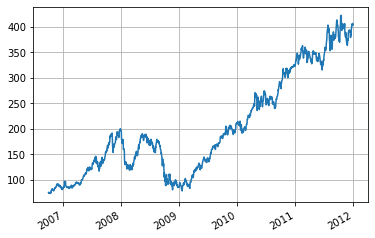

In [85]:

# Import Matplotlib's `pyplot` module as `plt`
import matplotlib.pyplot as plt

# Plot the closing prices for `aapl`
aapl['Close'].plot(grid=True)

# Show the plot
plt.show()

## Common Financial Analysis

### Returns

In [86]:
# Assign `Adj Close` to `daily_close`
daily_close = aapl[['Adj Close']]

# Daily returns
daily_pct_c = daily_close.pct_change()

# Replace NA values with 0
daily_pct_c.fillna(0, inplace=True)

# Inspect daily returns
print(daily_pct_c)

# Daily log returns
daily_log_returns = np.log(daily_close.pct_change()+1)

# Print daily log returns
print(daily_log_returns)

            Adj Close
2006-10-02   0.000000
2006-10-03  -0.010419
2006-10-04   0.017549
2006-10-05  -0.007296
2006-10-06  -0.008152
...               ...
2011-12-23   0.011993
2011-12-27   0.007934
2011-12-28  -0.009569
2011-12-29   0.006159
2011-12-30  -0.000296

[1323 rows x 1 columns]
            Adj Close
2006-10-02        NaN
2006-10-03  -0.010474
2006-10-04   0.017396
2006-10-05  -0.007323
2006-10-06  -0.008185
...               ...
2011-12-23   0.011922
2011-12-27   0.007903
2011-12-28  -0.009615
2011-12-29   0.006140
2011-12-30  -0.000296

[1323 rows x 1 columns]


In [87]:
# Resample `aapl` to business months, take last observation as value 
monthly = aapl.resample('BM').apply(lambda x: x[-1])

# Calculate the monthly percentage change
monthly.pct_change()

# Resample `aapl` to quarters, take the mean as value per quarter
quarter = aapl.resample("4M").mean()

# Calculate the quarterly percentage change
quarter.pct_change()

,Open,High,Low,Close,Volume,Adj Close
2006-10-31,NaN,NaN,NaN,NaN,NaN,NaN
2007-02-28,0.125777,0.126451,0.121460,0.122860,0.369611,0.122860
2007-06-30,0.196030,0.195413,0.198331,0.197735,-0.080296,0.197735
2007-10-31,0.400961,0.404613,0.392010,0.400796,0.306882,0.400796
2008-02-29,0.127066,0.130711,0.117746,0.120394,0.172293,0.120394
2008-06-30,-0.003550,-0.004290,0.005927,0.003673,-0.209762,0.003673
2008-10-31,-0.114267,-0.108879,-0.124618,-0.118803,0.133219,-0.118803
2009-02-28,-0.363639,-0.363388,-0.359305,-0.360865,-0.161601,-0.360865
2009-06-30,0.312134,0.304359,0.324702,0.316588,-0.386935,0.316588
2009-10-31,0.421239,0.411193,0.425117,0.415901,-0.158270,0.415901


In [88]:
# Daily returns
daily_pct_c = daily_close / daily_close.shift(1) - 1

# Print `daily_pct_c`
print(daily_pct_c)

            Adj Close
2006-10-02        NaN
2006-10-03  -0.010419
2006-10-04   0.017549
2006-10-05  -0.007296
2006-10-06  -0.008152
...               ...
2011-12-23   0.011993
2011-12-27   0.007934
2011-12-28  -0.009569
2011-12-29   0.006159
2011-12-30  -0.000296

[1323 rows x 1 columns]


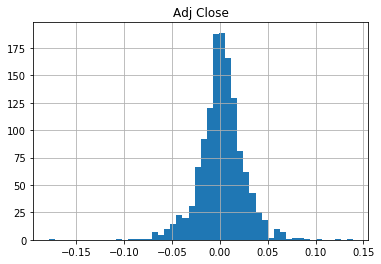

         Adj Close
count  1322.000000
mean      0.001566
std       0.023992
min      -0.179195
25%      -0.010672
50%       0.001677
75%       0.014306
max       0.139050


In [89]:

# Import matplotlib
import matplotlib.pyplot as plt

# Plot the distribution of `daily_pct_c`
daily_pct_c.hist(bins=50)

# Show the plot
plt.show()

# Pull up summary statistics
print(daily_pct_c.describe())

In [90]:
# Calculate the cumulative daily returns
cum_daily_return = (1 + daily_pct_c).cumprod()

# Print `cum_daily_return`
print(cum_daily_return)

            Adj Close
2006-10-02        NaN
2006-10-03   0.989581
2006-10-04   1.006946
2006-10-05   0.999599
2006-10-06   0.991451
...               ...
2011-12-23   5.387791
2011-12-27   5.430537
2011-12-28   5.378574
2011-12-29   5.411702
2011-12-30   5.410099

[1323 rows x 1 columns]


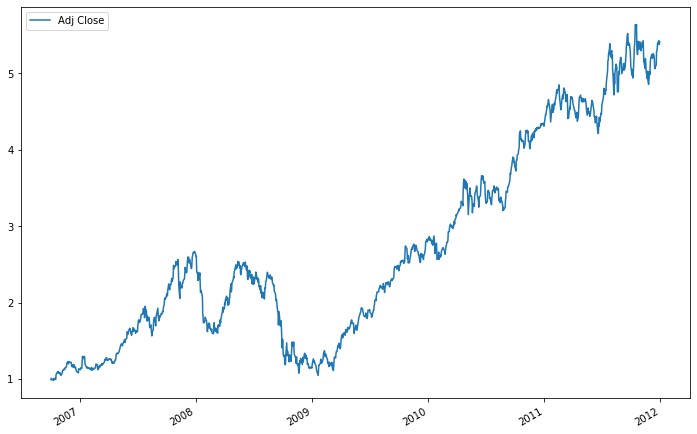

In [91]:

# Import matplotlib
import matplotlib.pyplot as plt 

# Plot the cumulative daily returns
cum_daily_return.plot(figsize=(12,8))

# Show the plot
plt.show()

In [92]:
# Resample the cumulative daily return to cumulative monthly return 
cum_monthly_return = cum_daily_return.resample("M").mean()

# Print the `cum_monthly_return`
print(cum_monthly_return)

            Adj Close
2006-10-31   1.031710
2006-11-30   1.140058
2006-12-31   1.155110
2007-01-31   1.187303
2007-02-28   1.145176
...               ...
2011-08-31   5.032897
2011-09-30   5.243032
2011-10-31   5.306305
2011-11-30   5.140466
2011-12-31   5.248871

[63 rows x 1 columns]


In [93]:

from pandas_datareader import data as pdr
import fix_yahoo_finance

def get(tickers, startdate, enddate):
    def data(ticker):
        return (pdr.get_data_yahoo(ticker, start=startdate, end=enddate))
    datas = map (data, tickers)
    return(pd.concat(datas, keys=tickers, names=['Ticker', 'Date']))

tickers = ['AAPL', 'MSFT', 'IBM', 'GOOG']
all_data = get(tickers, datetime.datetime(2006, 10, 1), datetime.datetime(2012, 1, 1))
all_data.head()

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Open       High        Low      Close  Adj Close  \
Ticker Date                                                                
AAPL   2006-10-02  10.728572  10.838572  10.614285  10.694285   9.283074   
       2006-10-03  10.635715  10.707143  10.455714  10.582857   9.186352   
       2006-10-04  10.585714  10.780000  10.451428  10.768572   9.347562   
       2006-10-05  10.647142  10.880000  10.590000  10.690000   9.279355   
       2006-10-06  10.631429  10.720000  10.544286  10.602858   9.203714   

                      Volume  
Ticker Date                   
AAPL   2006-10-02  178159800  
       2006-10-03  197677200  
       2006-10-04  207270700  
       2006-10-05  170970800  
       2006-10-06  116739700

In [94]:
#all_data = pd.read_csv("https://s3.amazonaws.com/assets.datacamp.com/blog_assets/all_stock_data.csv", index_col= [0,1], header=0, parse_dates=[1])

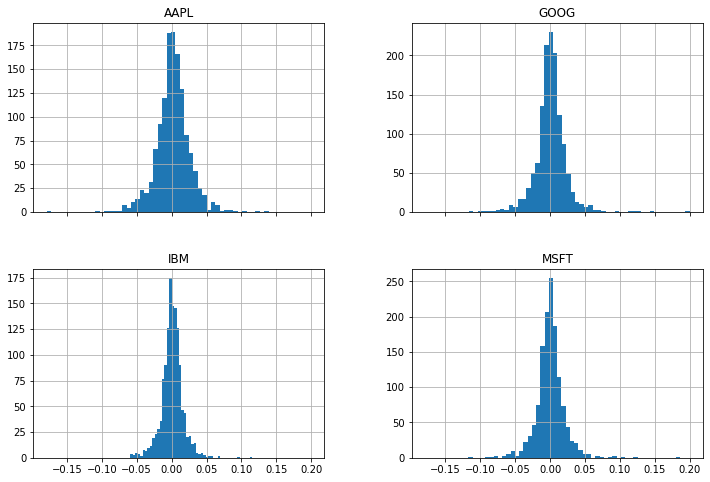

In [95]:
daily_close_px = all_data[['Adj Close']].reset_index().pivot('Date', 'Ticker', 'Adj Close')

# Calculate the daily percentage change for `daily_close_px`
daily_pct_change = daily_close_px.pct_change()

# Plot the distributions
daily_pct_change.hist(bins=50, sharex=True, figsize=(12,8))

# Show the resulting plot
plt.show()

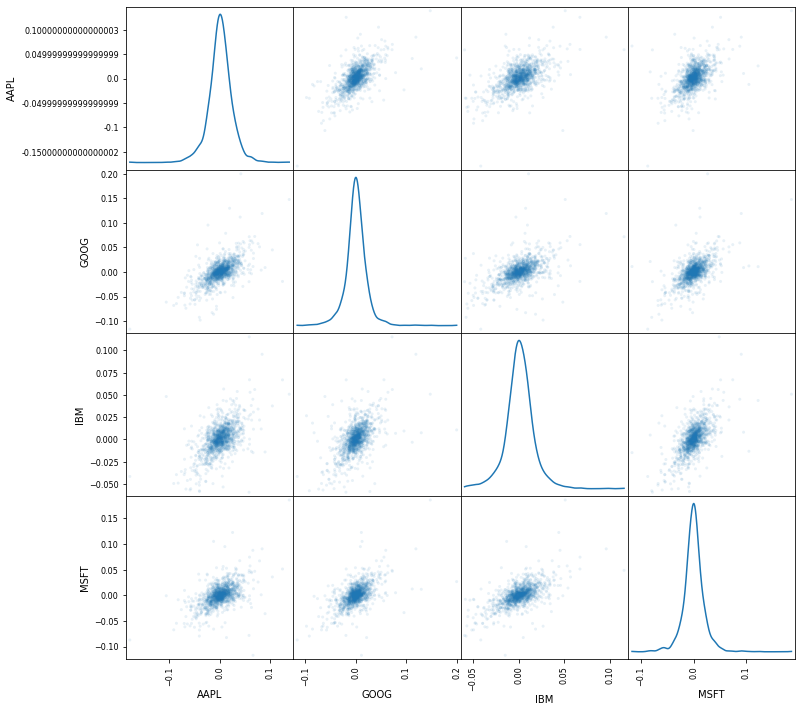

In [96]:
# Plot a scatter matrix with the `daily_pct_change` data 
pd.plotting.scatter_matrix(daily_pct_change, diagonal='kde', alpha=0.1,figsize=(12,12))

# Show the plot
plt.show()

## Moving Windows

In [97]:
# Isolate the adjusted closing prices 
adj_close_px = aapl['Adj Close']

# Calculate the moving average
moving_avg = adj_close_px.rolling(window=40).mean()

# Inspect the result
moving_avg[-10:]

2011-12-16    55.529679
2011-12-19    55.491607
2011-12-20    55.456536
2011-12-21    55.451822
2011-12-22    55.444500
2011-12-23    55.439643
2011-12-27    55.445286
2011-12-28    55.437643
2011-12-29    55.468393
2011-12-30    55.495500
Name: Adj Close, dtype: float64

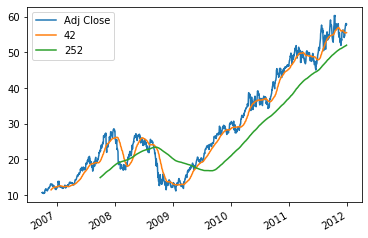

In [98]:
# Short moving window rolling mean
aapl['42'] = adj_close_px.rolling(window=40).mean()

# Long moving window rolling mean
aapl['252'] = adj_close_px.rolling(window=252).mean()

# Plot the adjusted closing price, the short and long windows of rolling means
aapl[['Adj Close', '42', '252']].plot()

plt.show()

## Volatility Calculation

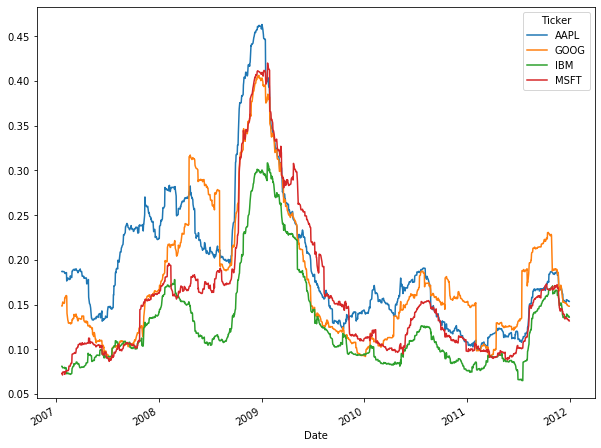

In [99]:
# Define the minumum of periods to consider 
min_periods = 75 

# Calculate the volatility
vol = daily_pct_change.rolling(min_periods).std() * np.sqrt(min_periods) 

# Plot the volatility
vol.plot(figsize=(10, 8))

# Show the plot
plt.show()

## Ordinary Least-Squares Regression (OLS)

In [102]:
# Import the `api` model of `statsmodels` under alias `sm`
import statsmodels.api as sm
from pandas import tseries
from datetime import date, datetime

# Isolate the adjusted closing price
all_adj_close = all_data[['Adj Close']]

# Calculate the returns 
all_returns = np.log(all_adj_close / all_adj_close.shift(1))

# Isolate the AAPL returns 
aapl_returns = all_returns.iloc[all_returns.index.get_level_values('Ticker') == 'AAPL']
aapl_returns.index = aapl_returns.index.droplevel('Ticker')

# Isolate the MSFT returns
msft_returns = all_returns.iloc[all_returns.index.get_level_values('Ticker') == 'MSFT']
msft_returns.index = msft_returns.index.droplevel('Ticker')

# Build up a new DataFrame with AAPL and MSFT returns
return_data = pd.concat([aapl_returns, msft_returns], axis=1)[1:]
return_data.columns = ['AAPL', 'MSFT']

# Add a constant 
X = sm.add_constant(return_data['AAPL'])

# Construct the model
model = sm.OLS(return_data['MSFT'],X).fit()

# Print the summary
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                   MSFT   R-squared:                       0.281
Model:                            OLS   Adj. R-squared:                  0.280
Method:                 Least Squares   F-statistic:                     515.5
Date:                Mon, 02 Mar 2020   Prob (F-statistic):           1.33e-96
Time:                        18:37:46   Log-Likelihood:                 3514.0
No. Observations:                1322   AIC:                            -7024.
Df Residuals:                    1320   BIC:                            -7014.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0005      0.000     -1.119      0.2

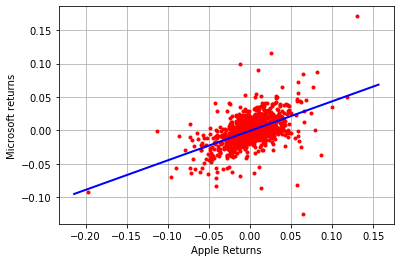

In [103]:
plt.plot(return_data['AAPL'], return_data['MSFT'], 'r.')

ax = plt.axis()
x = np.linspace(ax[0], ax[1] + 0.01)

plt.plot(x, model.params[0] + model.params[1] * x, 'b', lw=2)

plt.grid(True)
plt.axis('tight')
plt.xlabel('Apple Returns')
plt.ylabel('Microsoft returns')

plt.show()

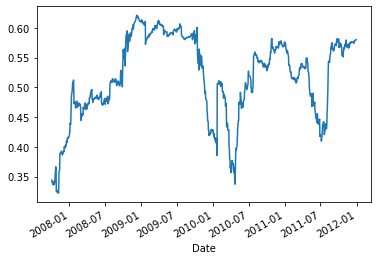

In [104]:

return_data['MSFT'].rolling(window=252).corr(return_data['AAPL']).plot()
plt.show()

## Building A Trading Strategy With Python

In [105]:
# Initialize the short and long windows
short_window = 40
long_window = 100

# Initialize the `signals` DataFrame with the `signal` column
signals = pd.DataFrame(index=aapl.index)
signals['signal'] = 0.0

# Create short simple moving average over the short window
signals['short_mavg'] = aapl['Close'].rolling(window=short_window, min_periods=1, center=False).mean()

# Create long simple moving average over the long window
signals['long_mavg'] = aapl['Close'].rolling(window=long_window, min_periods=1, center=False).mean()

# Create signals
signals['signal'][short_window:] = np.where(signals['short_mavg'][short_window:] 
                                            > signals['long_mavg'][short_window:], 1.0, 0.0)   

# Generate trading orders
signals['positions'] = signals['signal'].diff()


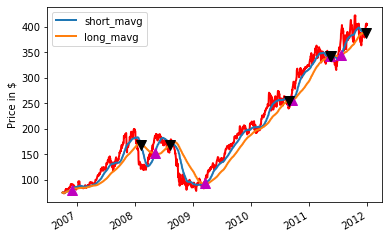

In [106]:
# Initialize the plot figure
fig = plt.figure()

# Add a subplot and label for y-axis
ax1 = fig.add_subplot(111,  ylabel='Price in $')

# Plot the closing price
aapl['Close'].plot(ax=ax1, color='r', lw=2.)

# Plot the short and long moving averages
signals[['short_mavg', 'long_mavg']].plot(ax=ax1, lw=2.)

# Plot the buy signals
ax1.plot(signals.loc[signals.positions == 1.0].index, 
         signals.short_mavg[signals.positions == 1.0],
         '^', markersize=10, color='m')
         
# Plot the sell signals
ax1.plot(signals.loc[signals.positions == -1.0].index, 
         signals.short_mavg[signals.positions == -1.0],
         'v', markersize=10, color='k')
         
# Show the plot
plt.show()

## Backtesting A Strategy

In [107]:
# Set the initial capital
initial_capital= float(100000.0)

# Create a DataFrame `positions`
positions = pd.DataFrame(index=signals.index).fillna(0.0)

# Buy a 100 shares
positions['AAPL'] = 100*signals['signal']   
  
# Initialize the portfolio with value owned   
portfolio = positions.multiply(aapl['Adj Close'], axis=0)

# Store the difference in shares owned 
pos_diff = positions.diff()

# Add `holdings` to portfolio
portfolio['holdings'] = (positions.multiply(aapl['Adj Close'], axis=0)).sum(axis=1)

# Add `cash` to portfolio
portfolio['cash'] = initial_capital - (pos_diff.multiply(aapl['Adj Close'], axis=0)).sum(axis=1).cumsum()   

# Add `total` to portfolio
portfolio['total'] = portfolio['cash'] + portfolio['holdings']

# Add `returns` to portfolio
portfolio['returns'] = portfolio['total'].pct_change()

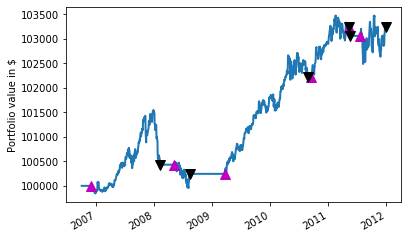

In [108]:
import matplotlib.pyplot as plt

fig = plt.figure()

ax1 = fig.add_subplot(111, ylabel='Portfolio value in $')

# Plot the equity curve in dollars
portfolio['total'].plot(ax=ax1, lw=2.)

# Plot the "buy" trades against the equity curve
ax1.plot(portfolio.loc[signals.positions == 1.0].index, 
         portfolio.total[signals.positions == 1.0],
         '^', markersize=10, color='m')

# Plot the "sell" trades against the equity curve
ax1.plot(portfolio.loc[signals.positions == -1.0].index, 
         portfolio.total[signals.positions == -1.0],
         'v', markersize=10, color='k')

# Show the plot
plt.show()

## Evaluating Moving Average Crossover Strategy

### Sharpe Ratio

In [109]:
# Isolate the returns of your strategy
returns = portfolio['returns']

# annualized Sharpe ratio
sharpe_ratio = np.sqrt(252) * (returns.mean() / returns.std())

# Print the Sharpe ratio
print(sharpe_ratio)

0.7268769500133708


### Maximum Drawdown

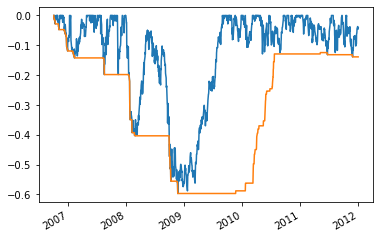

In [110]:
# Define a trailing 252 trading day window
window = 252

# Calculate the max drawdown in the past window days for each day
rolling_max = aapl['Adj Close'].rolling(window, min_periods=1).max()
daily_drawdown = aapl['Adj Close']/rolling_max - 1.0

# Calculate the minimum (negative) daily drawdown
max_daily_drawdown = daily_drawdown.rolling(window, min_periods=1).min()

# Plot the results
daily_drawdown.plot()
max_daily_drawdown.plot()

# Show the plot
plt.show()

### Compound Annual Growth Rate (CAGR)

In [111]:
# Get the number of days in `aapl`
days = (aapl.index[-1] - aapl.index[0]).days

# Calculate the CAGR 
cagr = ((((aapl['Adj Close'][-1]) / aapl['Adj Close'][1])) ** (365.0/days)) - 1

# Print CAGR
print(cagr)

0.3823445620598196


# A Simple Time Series Analysis Of The S&P 500 Index

In this blog post we'll examine some common techniques used in time series analysis by applying them to a data set containing daily closing values for the S&P 500 stock market index from 1950 up to present day. The objective is to explore some of the basic ideas and concepts from time series analysis, and observe their effects when applied to a real world data set. Although it's not possible to actually predict changes in the index using these techniques, the ideas presented here could theoretically be used as part of a larger strategy involving many additional variables to conduct a regression or machine learning effort.

Time series analysis is a branch of statistics that involves reasoning about ordered sequences of related values in order to extract meaningful statistics and other characteristics of the data. It's used in a wide range of disciplines including econometrics, signal processing, weather forecasting, and basically any other field that involves time series data. These techniques are often used to develop models that can be used to attempt to forecast future values of a series, either on their own or in concert with other variables.

To get started, let's first download the data. I got the historial data set from Yahoo Finance, which includes a link to download the whole thing as a .csv file. Now we can load up the data set and take a look. I'll be using several popular Python libraries for the analysis, so all of the code is in Python.

In [142]:
%matplotlib inline
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
import seaborn as sb
sb.set_style('darkgrid')

path = os.getcwd() + '\data\stock_data.csv'
stock_data = pd.read_csv(r'C:\Users\gordo\Programming\Data_Bank\sample\^GSPC.csv')
#stock_data['Date'] = stock_data['Date'].convert_objects(convert_dates='coerce')
#stock_data = stock_data.sort_index(by='Date')
stock_data = stock_data.set_index('Date')

stock_data

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-03-04,2814.370117,2816.879883,2767.659912,2792.810059,2792.810059,3919810000
2019-03-05,2794.409912,2796.439941,2782.969971,2789.649902,2789.649902,3585690000
2019-03-06,2790.270020,2790.270020,2768.689941,2771.449951,2771.449951,3786600000
2019-03-07,2766.530029,2767.250000,2739.090088,2748.929932,2748.929932,3904860000
2019-03-08,2730.790039,2744.129883,2722.270020,2743.070068,2743.070068,3423130000
...,...,...,...,...,...,...
2020-02-25,3238.939941,3246.989990,3118.770020,3128.209961,3128.209961,5591510000
2020-02-26,3139.899902,3182.510010,3108.989990,3116.389893,3116.389893,5478110000
2020-02-27,3062.540039,3097.070068,2977.389893,2978.760010,2978.760010,7058840000


The first obvious thing to note, aside from the two giant dips at the tail end corresponding to the market crashes in 2002 and 2008, is that the data is clearly non-stationary. This makes sense for market data as it tends to go up in the long run more than it goes down. This is a problem for time series analysis though as non-stationary data is hard to reason about. The first thing we can try is a first difference of the series. In other words, subtract the previous value t-1 from the current value t to get the difference d(t).

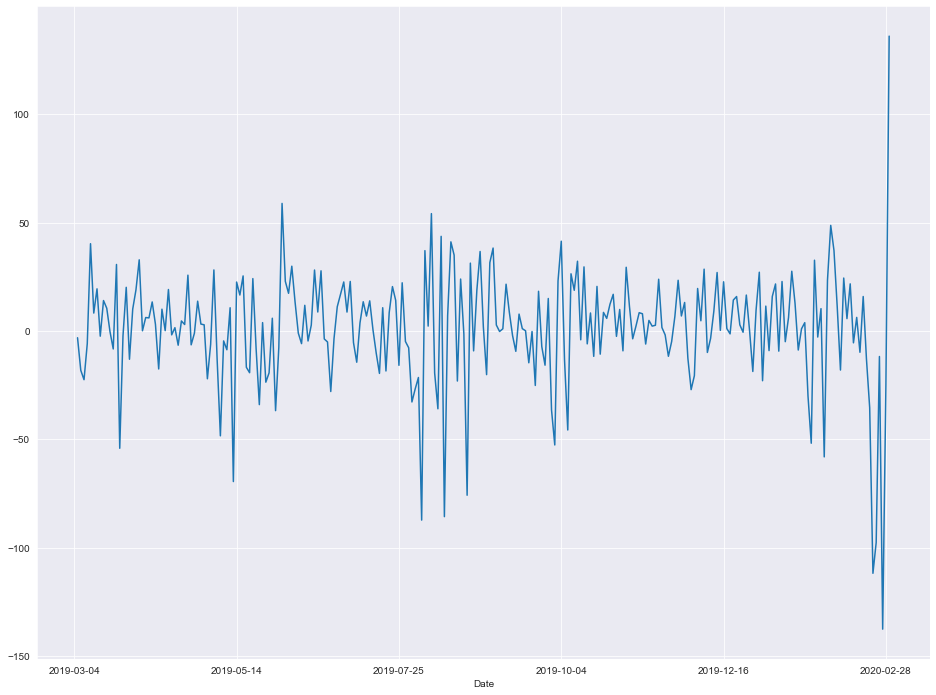

In [143]:
stock_data['First Difference'] = stock_data['Close'] - stock_data['Close'].shift()
stock_data['First Difference'].plot(figsize=(16, 12))

The data no longer appears to be trending up over time and is instead centered around 0. There's another problem though. Look at the variance. It's very small early on and steadily increases over time. This is a sign that the data is not only non-stationary but also exponentially increasing. The magnitude of the day-to-day variations at present day completely dwarf the magnitude of the changes in 1950. To deal with this, we'll apply a log transform to the original series.

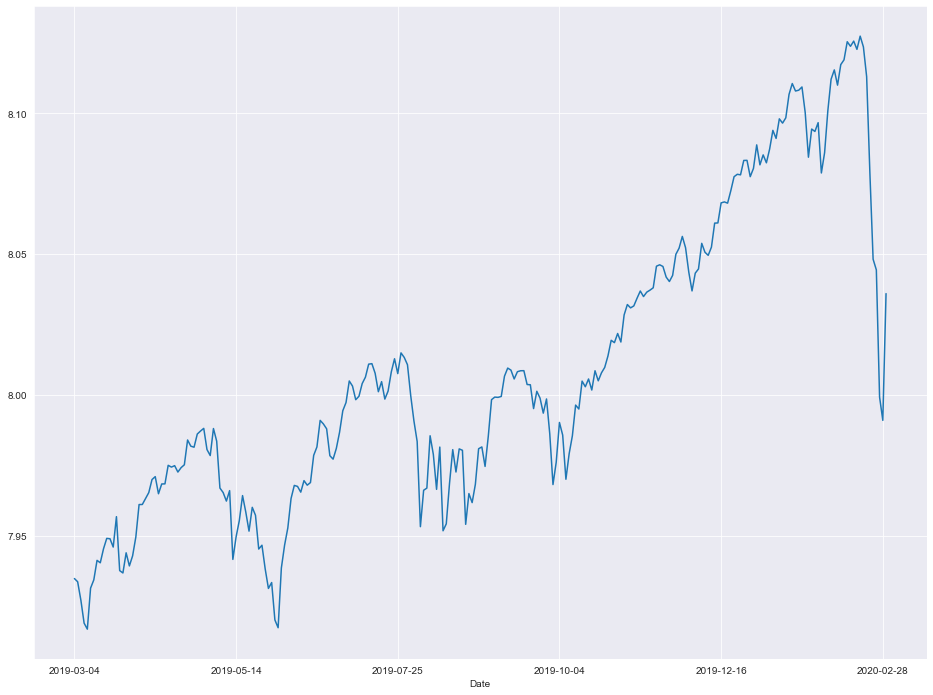

In [144]:
stock_data['Natural Log'] = stock_data['Close'].apply(lambda x: np.log(x))
stock_data['Natural Log'].plot(figsize=(16, 12))

So that gives us the original closing price with a log transform applied to "flatten" the data from an exponential curve to a linear curve. One way to visually see the effect that the log transform had is to analyze the variance over time. We can use a rolling variance statistic and compare both the original series and the logged series.

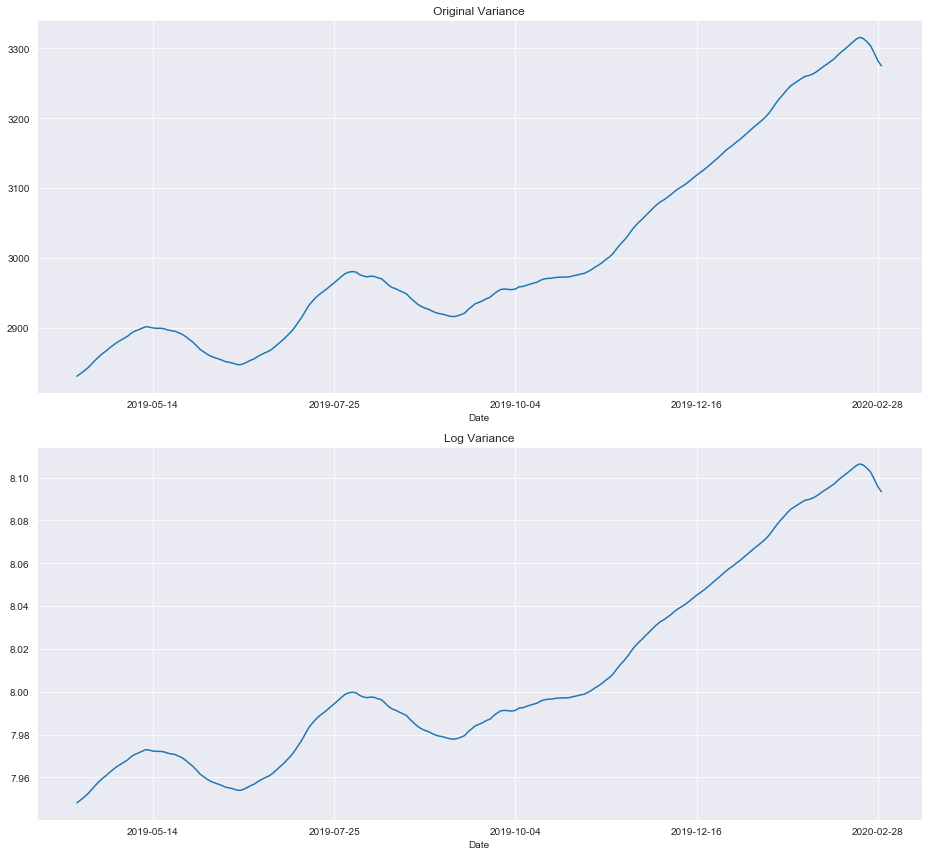

In [148]:
stock_data['Original Variance'] = stock_data['Close'].rolling(30).mean()
stock_data['Log Variance'] = stock_data['Natural Log'].rolling(30).mean()

 #= pd.rolling_mean(stock_data['Close'], 30, min_periods=None, freq=None, center=True)
 #= pd.rolling_mean(stock_data['Natural Log'], 30, min_periods=None, freq=None, center=True)

fig, ax = plt.subplots(2, 1, figsize=(13, 12))
stock_data['Original Variance'].plot(ax=ax[0], title='Original Variance')
stock_data['Log Variance'].plot(ax=ax[1], title='Log Variance')
fig.tight_layout()

#ts_log.rolling(30).mean()

Observe that in the top graph, we can't even see any of the variations until the late 80s. In the bottom graph however it's a different story, changes in the value are clearly visible throughout the entire data set. From this view, it's clear that our transformation has made the variance relatively constant.

Now we can see the earlier variations in the data set quite a bit better than before. We still need to take the first difference though so let's calculate that from the logged series.

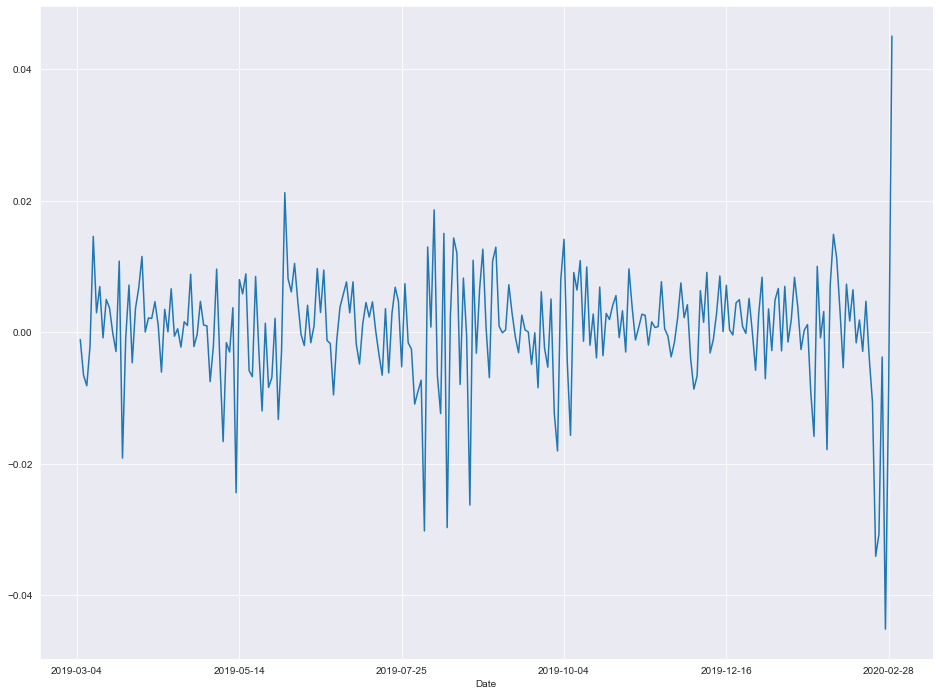

In [149]:
stock_data['Logged First Difference'] = stock_data['Natural Log'] - stock_data['Natural Log'].shift()
stock_data['Logged First Difference'].plot(figsize=(16, 12))

Much better! We now have a stationary time series model of daily changes to the S&P 500 index. Now let's create some lag variables y(t-1), y(t-2) etc. and examine their relationship to y(t). We'll look at 1 and 2-day lags along with weekly and monthly lags to look for "seasonal" effects.

One interesting visual way to evaluate the relationship between lagged variables is to do a scatter plot of the original variable vs. the lagged variable and see where the distribution lies. We can do this with a joint plot using the seaborn package.

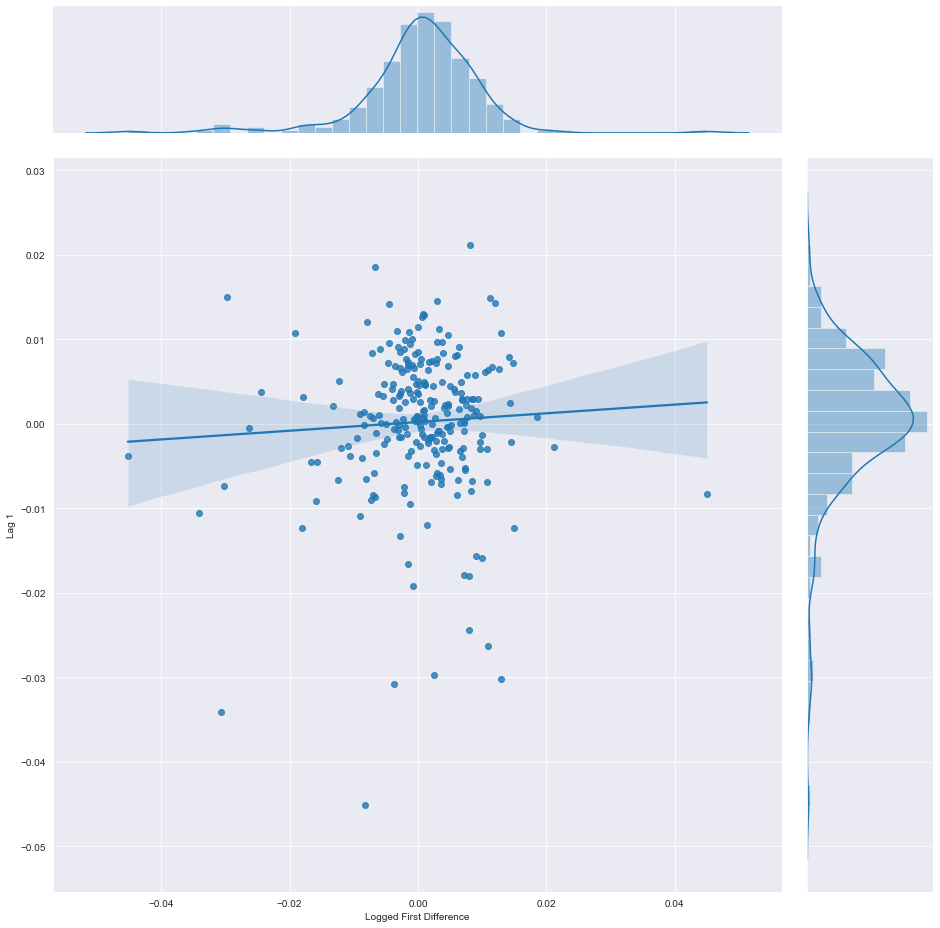

In [151]:
stock_data['Lag 1'] = stock_data['Logged First Difference'].shift()
stock_data['Lag 2'] = stock_data['Logged First Difference'].shift(2)
stock_data['Lag 5'] = stock_data['Logged First Difference'].shift(5)
stock_data['Lag 30'] = stock_data['Logged First Difference'].shift(30)

sb.jointplot('Logged First Difference', 'Lag 1', stock_data, kind='reg', height=13)


Notice how tightly packed the mass is around 0. It also appears to be pretty evenly distributed - the marginal distributions on both axes are roughly normal. This seems to indicate that knowing the index value one day doesn't tell us much about what it will do the next day.

It probably comes as no surprise that there's very little correlation between the change in value from one day to the next. Although I didn't plot them out here, the other lagged variables that we created above show similar results. There could be a relationship to other lag steps that we haven't tried, but it's impractical to test every possible lag value manually. Fortunately there is a class of functions that can systematically do this for us.

In [153]:
from statsmodels.tsa.stattools import acf
from statsmodels.tsa.stattools import pacf

lag_correlations = acf(stock_data['Logged First Difference'].iloc[1:])
lag_partial_correlations = pacf(stock_data['Logged First Difference'].iloc[1:])

The auto-correlation function computes the correlation between a variable and itself at each lag step up to some limit (in this case 40). The partial auto-correlation function computes the correlation at each lag step that is NOT already explained by previous, lower-order lag steps. We can plot the results to see if there are any significant correlations.

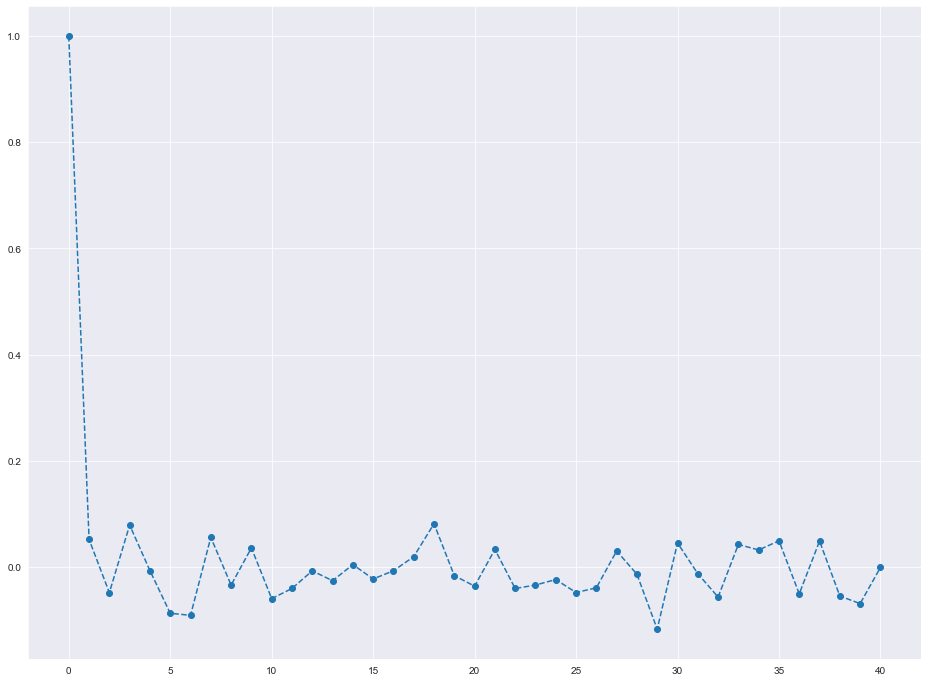

In [154]:
fig, ax = plt.subplots(figsize=(16,12))
ax.plot(lag_correlations, marker='o', linestyle='--')

The auto-correlation and partial-autocorrelation results are very close to each other (I only plotted the auto-correlation results above). What this shows is that there is no significant (> 0.2) correlation between the value at time t and at any time prior to t up to 40 steps behind. In order words, the series is a random walk.

Another interesting technique we can try is a decomposition. This is a technique that attempts to break down a time series into trend, seasonal, and residual factors. Statsmodels comes with a decompose function out of the box.

<Figure size 432x288 with 0 Axes>

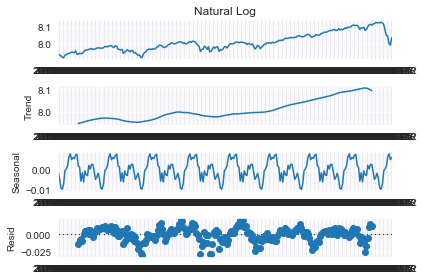

In [156]:
from statsmodels.tsa.seasonal import seasonal_decompose

decomposition = seasonal_decompose(stock_data['Natural Log'], model='additive', period=30)
fig = plt.figure()
fig = decomposition.plot()

Since we don't see any real cycle in the data, the visualization is not that effective in this case. For data where this is a strong seasonal pattern though it can be very useful. The folling instance, for example, is a sample from the statsmodels documentation showing CO2 emissions data over time.

<Figure size 432x288 with 0 Axes>

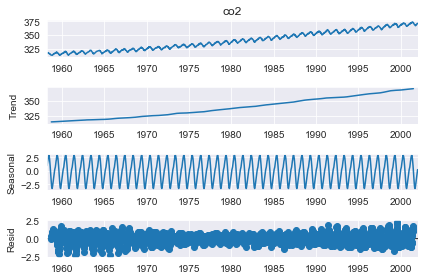

In [157]:
co2_data = sm.datasets.co2.load_pandas().data
co2_data.co2.interpolate(inplace=True)
result = sm.tsa.seasonal_decompose(co2_data.co2)
fig = plt.figure()
fig = result.plot()

The decomposition is much more useful in this case. There are three clearly distinct components to the time series - a trend line, a seasonal adjustment, and residual values. Each of these would need to be accounted for and modeled appropriately.

Going back to our stock data, we're already observed that it's a random walk and that our lagged variables don't seem to have much impact, but we can still try fitting some ARIMA models and see what we get. Let's start with a simple moving average model.

C:\Users\gordo\AppData\Local\Continuum\anaconda3\envs\notebook\lib\site-packages\statsmodels\tsa\base\tsa_model.py:216: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



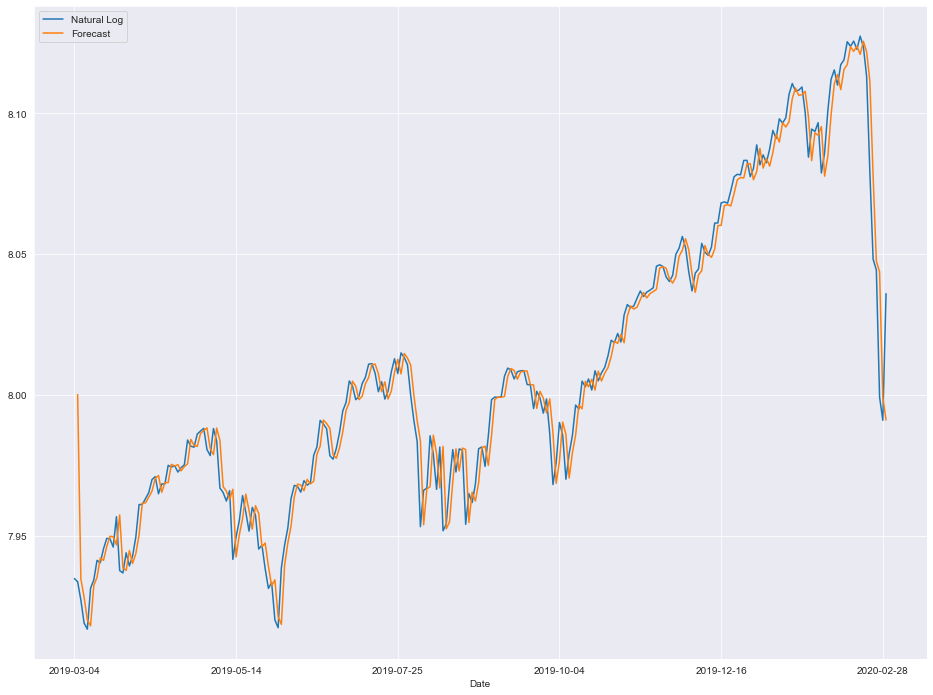

In [158]:
model = sm.tsa.ARIMA(stock_data['Natural Log'].iloc[1:], order=(1, 0, 0))
results = model.fit(disp=-1)
stock_data['Forecast'] = results.fittedvalues
stock_data[['Natural Log', 'Forecast']].plot(figsize=(16, 12))

So at first glance it seems like this model is doing pretty well. But although it appears like the forecasts are really close (the lines are almost indistinguishable after all), remember that we used the un-differenced series! The index only fluctuates a small percentage day-to-day relative to the total absolute value. What we really want is to predict the first difference, or the day-to-day moves. We can either re-run the model using the differenced series, or add an "I" term to the ARIMA model (resulting in a (1, 1, 0) model) which should accomplish the same thing. Let's try using the differenced series.

C:\Users\gordo\AppData\Local\Continuum\anaconda3\envs\notebook\lib\site-packages\statsmodels\tsa\base\tsa_model.py:216: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



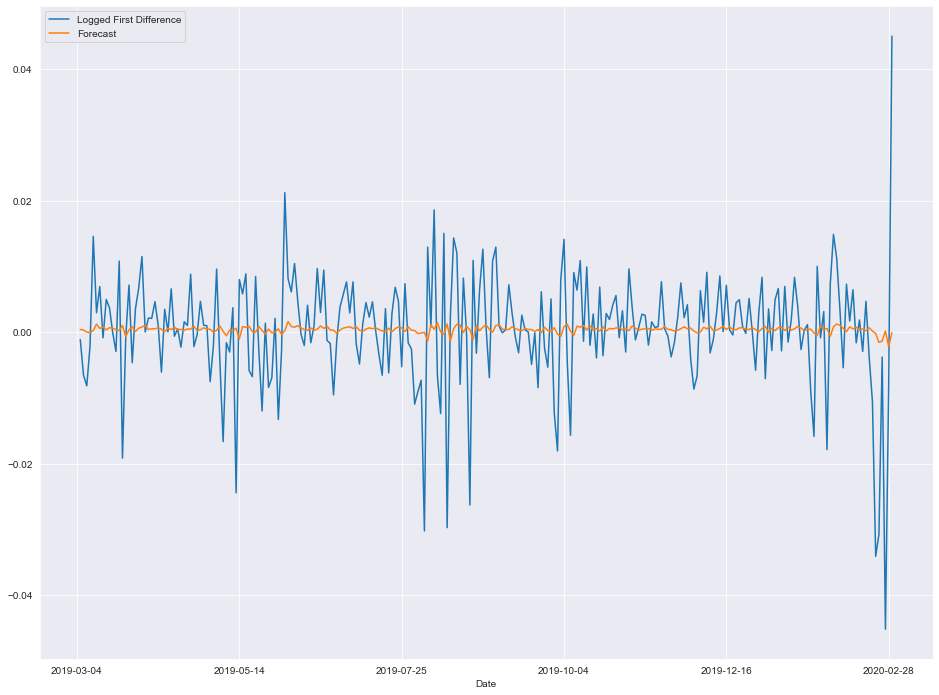

In [159]:
model = sm.tsa.ARIMA(stock_data['Logged First Difference'].iloc[1:], order=(1, 0, 0))
results = model.fit(disp=-1)
stock_data['Forecast'] = results.fittedvalues
stock_data[['Logged First Difference', 'Forecast']].plot(figsize=(16, 12))

It's a little hard to tell, but it appears like our forecasted changes are generally much smaller than the actual changes. It might be worth taking a closer look at a subset of the data to see what's really going on.

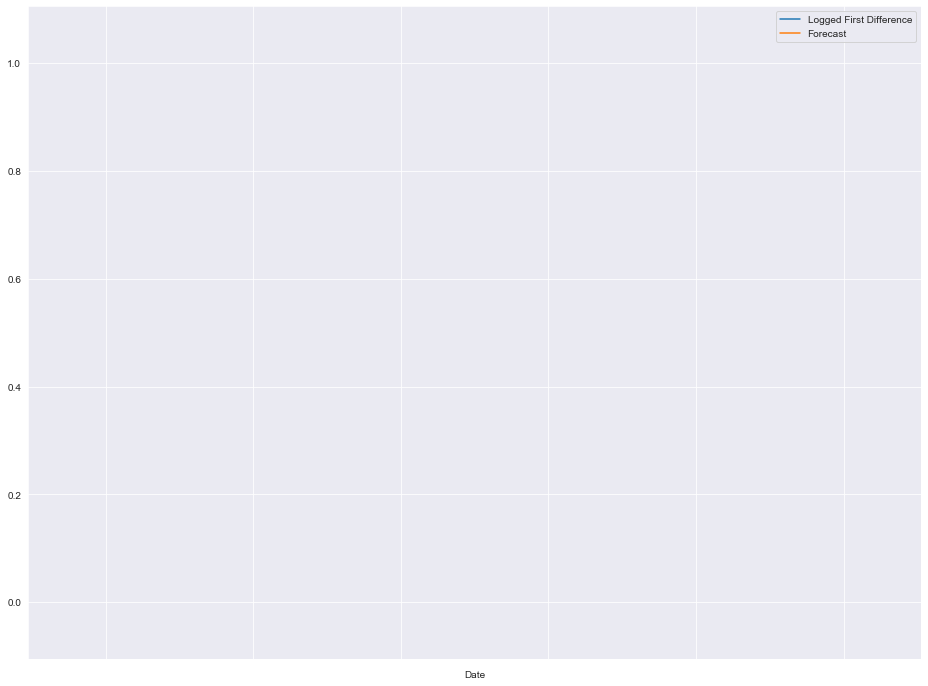

In [161]:
stock_data[['Logged First Difference', 'Forecast']].iloc[1200:1600, :].plot(figsize=(16, 12))


So now it's pretty obvious that the forecast is way off. We're predicting tiny little variations relative to what is actually happening day-to-day. Again, this is more of less expected with a simple moving average model of a random walk time series. There's not enough information from the previous days to accurately forcast what's going to happen the next day.

A moving average model doesn't appear to do so well. What about an exponential smoothing model? Exponential smoothing spreads out the impact of previous values using an exponential weighting, so things that happened more recently are more impactful than things that happened a long time ago. Maybe this "smarter" form of averaging will be more accurate?

C:\Users\gordo\AppData\Local\Continuum\anaconda3\envs\notebook\lib\site-packages\statsmodels\tsa\base\tsa_model.py:216: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



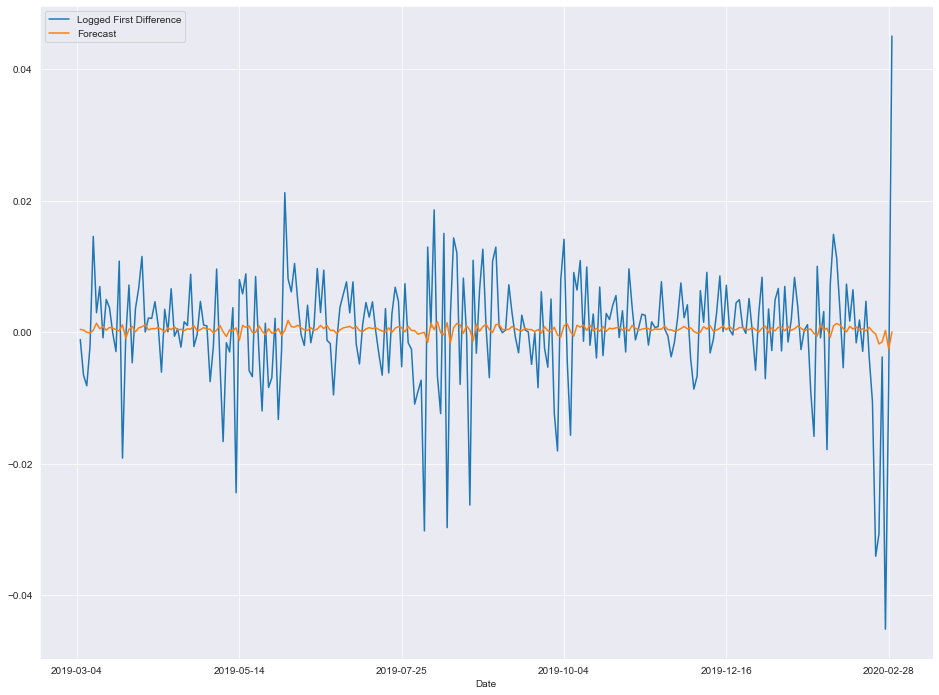

In [162]:
model = sm.tsa.ARIMA(stock_data['Logged First Difference'].iloc[1:], order=(0, 0, 1))
results = model.fit(disp=-1)
stock_data['Forecast'] = results.fittedvalues
stock_data[['Logged First Difference', 'Forecast']].plot(figsize=(16, 12))

You can probably guess the answer...if predicting the stock market were this easy, everyone would be doing it! As I mentioned at the top, the point of this analysis wasn't to claim that you can predict the market with these techniques, but rather to demonstrate the types of the analysis one might use when breaking down time series data. Time series analysis is a very rich field with lots more technical analysis than what I went into here (much of which I'm still learning). If you're interested in doing a deeper dive, I recommend these notes from a professor at Duke. A lot of what I learned about the field I picked up from reading online resources like this one. Finally, the original source code from this post is hosted on GitHub here, along with a variety of other notebooks. Feel free to check it out!

# Time Series Forecasting With Prophet

In [163]:
%matplotlib inline
import os
import pandas as pd
import numpy as np
from fbprophet import Prophet

path = os.path.dirname(os.path.dirname(os.getcwd())) + '/data/manning.csv'
data = pd.read_csv(path)
data['ds'] = pd.to_datetime(data['ds'])
data.head()

ModuleNotFoundError: No module named 'fbprophet'

In [ ]:
data.set_index('ds').plot(figsize=(12, 9))


In [ ]:
data['y'] = np.log(data['y'])
data.set_index('ds').plot(figsize=(12, 9))

In [ ]:
m = Prophet()
m.fit(data)

In [ ]:
m.params


In [ ]:
future_data = m.make_future_dataframe(periods=365)
future_data.tail()

In [ ]:
forecast = m.predict(future_data)
forecast.columns

In [ ]:
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()


In [ ]:
m.plot(forecast);


In [ ]:
m.plot_components(forecast);


In [ ]:
playoffs = pd.DataFrame({
  'holiday': 'playoff',
  'ds': pd.to_datetime(['2008-01-13', '2009-01-03', '2010-01-16',
                        '2010-01-24', '2010-02-07', '2011-01-08',
                        '2013-01-12', '2014-01-12', '2014-01-19',
                        '2014-02-02', '2015-01-11', '2016-01-17',
                        '2016-01-24', '2016-02-07']),
  'lower_window': 0,
  'upper_window': 1,
})

superbowls = pd.DataFrame({
  'holiday': 'superbowl',
  'ds': pd.to_datetime(['2010-02-07', '2014-02-02', '2016-02-07']),
  'lower_window': 0,
  'upper_window': 1,
})

holidays = pd.concat((playoffs, superbowls))

In [ ]:
m = Prophet(holidays=holidays)
forecast = m.fit(data).predict(future_data)
m.plot_components(forecast);

In [ ]:
from sklearn.metrics import mean_absolute_error
data = m.predict(data)
mean_absolute_error(np.exp(data['y']), np.exp(data['yhat']))